In this notebook I perform an exploratory analysis in order to get some insights

- To investigate the relationship between the hourly pay before and after the COVID-19 Pandemic in annual survey of hours and earnings 

- To examine key indicators (signals produced from the patterns observed in the movements ) of hourly pay and how that has changed after the pandemic.

- 

company, based on that I create a predictive model that allows to foresee which employee is going to leave next.

### Business Understanding

### Objectives:
- PRIMARY: To investigate the relationship between the hourly pay before and after the COVID-19 Pandemic in annual survey of hours and earnings - workplace analysis - Nomis - Official Labour Market Statistics from 2017-2021.
-   SECONDARY: To examine key indicators of hourly pay and how that has changed after the pandemic. 
-   TERTIARY: To obtain open-source data, prepare for analysis by taking required data for it using CRISP DM process and visualise those patterns of hourly pay before and after the pandemic.


**Research Questions:**



	•	Can we compare the hourly pay of part time and full-time workers in the UK, before and after the COVID 19 pandemic?
	•	Has the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK?


In [1]:
import numpy as np
import pandas as pd

# Make sure figures appear inline in Ipython Notebook
%matplotlib inline

import matplotlib
import seaborn as sns
import matplotlib.dates as md
from matplotlib import pyplot as plt

# 3rd party
import plotly.graph_objs as go


In [2]:
df = pd.read_csv('data/formatted-igp-3.csv', delimiter = ',', encoding='latin-1', header=0)
df.head()


,Unnamed: 0,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,...,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,...,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3
2,2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,...,487000,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2
3,3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,...,941000,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6
4,4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,...,358000,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3


In [3]:
# drop 'Unnamed: 0' column
df.drop('Unnamed: 0', axis=1, inplace=True)


In [4]:
# show 
df.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,487000,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,941000,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,358000,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3


In [5]:
df.tail()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
10027,Part Time Workers,Hours worked - overtime,Devon,ecounty,-13.3,-,-23.9,-,41.3,-,...,-3.7,-,-,-,-,-,-,-,-1.8,-
10028,Part Time Workers,Hours worked - overtime,Dorset,ecounty,-,-,-,-,19.1,-,...,-,-,-,-,-,-,-,-,-,-
10029,Part Time Workers,Hours worked - overtime,Gloucestershire,ecounty,-4.7,-,28.9,-,-4.4,-,...,-18.3,-,-,-,-,-,-,-,-,-
10030,Part Time Workers,Hours worked - overtime,Somerset,ecounty,16.6,-,-23.1,-,-,-,...,-20.3,-,-,-,-,-,-,-,-,-
10031,Part Time Workers,Hours worked - overtime,Wiltshire,ecounty,-26.5,-,-5.8,-,10.5,-,...,-,-,-,-,-,-,-,-,-,-


In [296]:
df

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,487000,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,941000,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,358000,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10027,Part Time Workers,Hours worked - overtime,Devon,ecounty,-13.3,NaN,-23.9,NaN,41.3,NaN,...,-3.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.8,NaN
10028,Part Time Workers,Hours worked - overtime,Dorset,ecounty,NaN,NaN,NaN,NaN,19.1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10029,Part Time Workers,Hours worked - overtime,Gloucestershire,ecounty,-4.7,NaN,28.9,NaN,-4.4,NaN,...,-18.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10030,Part Time Workers,Hours worked - overtime,Somerset,ecounty,16.6,NaN,-23.1,NaN,NaN,NaN,...,-20.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# show dimension and check datatype
print("Size/Shape of the dataset: ",df.shape)
print("\nChecking Data-type of each column:\n",df.dtypes)

Size/Shape of the dataset:  (10032, 24)

Checking Data-type of each column:
 work_type     object
pay_type      object
area          object
area_type     object
2012_pay      object
2012_conf%    object
2013_pay      object
2013_conf%    object
2014_pay      object
2014_conf%    object
2015_pay      object
2015_conf%    object
2016_pay      object
2016_conf%    object
2017_pay      object
2017_conf%    object
2018_pay      object
2018_conf%    object
2019_pay      object
2019_conf%    object
2020_pay      object
2020_conf%    object
2021_pay      object
2021_conf%    object
dtype: object


check how many null values we have

In [8]:
# is there null values
df.isnull().sum()

work_type     0
pay_type      0
area          0
area_type     0
2012_pay      0
2012_conf%    0
2013_pay      0
2013_conf%    0
2014_pay      0
2014_conf%    0
2015_pay      0
2015_conf%    0
2016_pay      0
2016_conf%    0
2017_pay      0
2017_conf%    0
2018_pay      0
2018_conf%    0
2019_pay      0
2019_conf%    0
2020_pay      0
2020_conf%    0
2021_pay      0
2021_conf%    0
dtype: int64

Because "NaN's" were denoted by hyphens `-`, our results indicate that there are no "NaN's" in the data. Let's convert the replace the hyphens with nans.

In [13]:
# Replace '-' with nan
df = df.replace('-', np.nan)

In [14]:
# sum the num of nans
df.isnull().sum()

work_type        0
pay_type         0
area             0
area_type        0
2012_pay       840
2012_conf%    4416
2013_pay       861
2013_conf%    4414
2014_pay       854
2014_conf%    4410
2015_pay       853
2015_conf%    4416
2016_pay       862
2016_conf%    4417
2017_pay       872
2017_conf%    4417
2018_pay      4532
2018_conf%    4540
2019_pay      4532
2019_conf%    4541
2020_pay      4458
2020_conf%    4551
2021_pay      1374
2021_conf%    4666
dtype: int64

- work_type, pay_type, Area and area_type has no nan's.
- the 2021_conf%' confidence column has the highest number of nan's
- 2018_pay and 2019_pay columns has the highest number of nan's.

a good function to check nan's

In [19]:
# Check for missing values
def missing_values_table(df):
    # number of missing values
    mis_val = df.isnull().sum()
    # % of missing values
    mis_val_percent = 100 * mis_val / len(df)
    # make table # axis '0' concat along index, '1' column
    mis_val_table = pd.concat([mis_val,mis_val_percent],axis=1) 
    # rename columns
    mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0:'Missing Values',1:'% of Total Values'})
    # sort by column
    mis_val_table_ren_columns = mis_val_table_ren_columns[mis_val_table_ren_columns.iloc[:,1]!=0].sort_values(
        '% of Total Values',ascending=False).round(1) #Review
    print("Your selected datset has "+str(df.shape[1])+" columns and "+str(len(df))+" observations.\n"
         "There are "+str(mis_val_table_ren_columns.shape[0])+" columns that have missing values.")
    # return the dataframe with missing info
    return mis_val_table_ren_columns



In [20]:
missing_values_table(df)

Your selected datset has 24 columns and 10032 observations.
There are 20 columns that have missing values.


,Missing Values,% of Total Values
2021_conf%,4666,46.5
2020_conf%,4551,45.4
2019_conf%,4541,45.3
2018_conf%,4540,45.3
2019_pay,4532,45.2
2018_pay,4532,45.2
2020_pay,4458,44.4
2016_conf%,4417,44.0
2017_conf%,4417,44.0
2015_conf%,4416,44.0


In [21]:
# index the dataframe columns
df.columns[3:]

Index(['area_type', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay',
       '2021_conf%'],
      dtype='object')

In [13]:
# show frames of the indexed columns
df[df.columns[3:]]

,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,country,10151000,0.2,10268000,0.2,10402000,0.2,10794000,0.2,10731000,...,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,country,8778000,0.2,8895000,0.2,9016000,0.2,9362000,0.2,9312000,...,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3
2,country,466000,1.9,473000,1.9,479000,1.9,500000,1.9,487000,...,487000,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2
3,country,907000,1.3,900000,1.3,907000,1.3,931000,1.3,933000,...,941000,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6
4,country,306000,2.3,279000,2.5,305000,2.4,335000,2.3,354000,...,358000,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10027,ecounty,-13.3,NaN,-23.9,NaN,41.3,NaN,-16.6,NaN,17.4,...,-3.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.8,NaN
10028,ecounty,NaN,NaN,NaN,NaN,19.1,NaN,-21.6,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10029,ecounty,-4.7,NaN,28.9,NaN,-4.4,NaN,-12.3,NaN,11.3,...,-18.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10030,ecounty,16.6,NaN,-23.1,NaN,NaN,NaN,NaN,NaN,-12.6,...,-20.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's examine which aspects are more associated since the level of pay and confidence are the main factors that interest us. 

## Data Pre-processing

In [14]:
# show dataframe
df.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,487000,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,941000,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,358000,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3


In [15]:
# see unique work_type's
df['work_type'].unique()

array(['Male Full Time Workers', 'Male Part Time Workers',
       'Female Full Time Workers', 'Female Part Time Workers',
       'Full Time Workers', 'Part Time Workers'], dtype=object)

In [16]:
# see unique pay_type's
df['pay_type'].unique()

array(['Weekly pay - basic', 'Hourly pay - gross',
       'Hourly pay - excluding overtime', 'Hours worked - total',
       'Hours worked - basic', 'Hours worked - overtime',
       'Weekly pay - gross'], dtype=object)

we can see work and pay type can be feature engineered to give us more features.

**We can get the**

- sex ( genders, male or female) [sex]
- working standard (is it full or part time) [work_standard]
- working time (did the individual got paid weekly, hourly, hours worked etc.) [work_time]
- pay standard (here we check for the work standard, either basic etc.) [pay_standard]
- separate the country from the count. 


let make a copy to prevent overwritting

In [22]:
# make a copy
data = df.copy()

Sex

the sex features can be extracted from the work_type column.

In [25]:
# test to see how this will extract
data['work_type'].iloc[-35].split()[0]

'Part'

In [26]:
# string extraction function
def sexExtract(t):
    t = t.split()[0]
    if t=='Part' or t=='Full':
        return None
    else:
        return t

In [27]:
sexExtract(data['work_type'].iloc[35])

'Male'

In [28]:
# set result to new sex column
data['sex'] = data['work_type'].apply(lambda x: sexExtract(x))

In [29]:
data.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2,Male
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3,Male
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2,Male
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6,Male
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3,Male


In [30]:
data.tail()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex
10027,Part Time Workers,Hours worked - overtime,Devon,ecounty,-13.3,NaN,-23.9,NaN,41.3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.8,NaN,None
10028,Part Time Workers,Hours worked - overtime,Dorset,ecounty,NaN,NaN,NaN,NaN,19.1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
10029,Part Time Workers,Hours worked - overtime,Gloucestershire,ecounty,-4.7,NaN,28.9,NaN,-4.4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
10030,Part Time Workers,Hours worked - overtime,Somerset,ecounty,16.6,NaN,-23.1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
10031,Part Time Workers,Hours worked - overtime,Wiltshire,ecounty,-26.5,NaN,-5.8,NaN,10.5,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None


**working standard** 

Working standard (is it full or part time).

work_standard, features can be extracted from the work_type column.

In [31]:
# test to see how this will extract
data['work_type'].iloc[35].split()[:-1]

['Male', 'Full', 'Time']

In [26]:
data['work_type'].iloc[-5]

'Part Time Workers'

In [27]:
data['work_type'].iloc[135].split()[1:3]

['Full', 'Time']

In [32]:
# extract string
def workstandardExtract(t):
    t= t.split()
    
    if len(t) > 3:
        return ' '.join(t[1:3])
    else:
        return ' '.join(t[:-1])
    

In [34]:
# test function
workstandardExtract(data['work_type'].iloc[-5])

'Part Time'

In [35]:
# set result to column
data['work_standard'] = data['work_type'].apply(lambda x: workstandardExtract(x))

In [36]:
data.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2,Male,Full Time
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3,Male,Full Time
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,489000,1.9,492000,1.9,484000,2.2,504000,2.2,Male,Full Time
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,949000,1.3,931000,1.4,859000,1.7,906000,1.6,Male,Full Time
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,343000,2.3,368000,2.3,414000,2.4,448000,2.3,Male,Full Time


**working time**

working time (did the individual got paid weekly, hourly, hours worked etc.) 

work_time, features can be extracted from the pay_type column.

In [37]:
data['pay_type'].iloc[-35].split()[0]

'Hours'

In [46]:
# def worktimeExtract(t):
#     return t.split()[0]

In [39]:
# worktimeExtract(data['pay_type'].iloc[35])

'Weekly'

In [44]:
data['work_time'] = data['pay_type'].apply(lambda x: x.split()[0])

In [45]:
# set result to column
data.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,pay_standard,work_time
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10930000,0.2,10459000,0.2,10980000,0.2,Male,Full Time,basic,Weekly
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9508000,0.2,9117000,0.3,9570000,0.3,Male,Full Time,basic,Weekly
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,492000,1.9,484000,2.2,504000,2.2,Male,Full Time,basic,Weekly
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,931000,1.4,859000,1.7,906000,1.6,Male,Full Time,basic,Weekly
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,368000,2.3,414000,2.4,448000,2.3,Male,Full Time,basic,Weekly


Lets get the pay standard (here we check for the work standard, either basic etc.) 

pay_standard, features can be extracted from the pay_type column.

In [47]:
data['pay_type'].iloc[334].split()[-1]

'gross'

In [48]:
# def paystandardExtract(t):
#     # split with hyphen and index the last in the list
#     return t.split('-')[-1]

In [49]:
# split with hyphen and index the last in the list
data['pay_standard'] = data['pay_type'].apply(lambda x: x.split('-')[-1])

In [50]:
data.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,pay_standard,work_time
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10930000,0.2,10459000,0.2,10980000,0.2,Male,Full Time,basic,Weekly
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9508000,0.2,9117000,0.3,9570000,0.3,Male,Full Time,basic,Weekly
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,492000,1.9,484000,2.2,504000,2.2,Male,Full Time,basic,Weekly
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,931000,1.4,859000,1.7,906000,1.6,Male,Full Time,basic,Weekly
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,368000,2.3,414000,2.4,448000,2.3,Male,Full Time,basic,Weekly


Get the countries.

In [52]:
df.area.unique()

array(['Great Britain', 'England', 'Wales', 'Scotland',
       'Northern Ireland', 'England and Wales', 'Durham (County)',
       'Northumb', 'Tyne and Wear (Met County)', 'Cheshire', 'Cumbria',
       'Greater Manchester (Met County)', 'Lancashire',
       'Merseyside (Met County)', 'North Yorkshire',
       'South Yorkshire (Met County)', 'West Yorkshire (Met County)',
       'Derbyshire', 'Leicestershire', 'Lincolnshire', 'Northamptonshire',
       'Nottinghamshire', 'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Bedfordshire',
       'Cambridgeshire', 'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk',
       'Inner London', 'Outer London', 'Buckinghamshire', 'East Sussex',
       'Hampshire', 'Kent', 'Oxfordshire', 'Surrey', 'West Sussex',
       'Cornwall and Isles of Scilly', 'Devon', 'Dorset',
       'Gloucestershire', 'Somerset', 'Wiltshire'], dtype=object)

 Great Britain consists of just England, Wales and Scotland, whereas the United Kingdom also includes Northern Ireland, as its long name states.
 
 ref: https://theculturetrip.com/europe/united-kingdom/articles/whats-the-difference-between-great-britain-and-the-united-kingdom/

Sovereign state: United Kingdom

county's are states



In [53]:
# set the country and states into directionary for better referencing
{
'Great Britain':['England', 'Wales', 'Scotland'],
    
 'England':['Northumb', 'Tyne and Wear (Met County)','Durham (County)', 'Cheshire', 'Cumbria',
           'Greater Manchester (Met County)', 'Lancashire', 'Merseyside (Met County)', 'North Yorkshire',
           'South Yorkshire (Met County)', 'West Yorkshire (Met County)','Derbyshire', 'Leicestershire', 'Lincolnshire', 'Northamptonshire',
       'Nottinghamshire', 'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Bedfordshire',
       'Cambridgeshire', 'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London', 'Outer London', 'Buckinghamshire', 'East Sussex',
       'Hampshire', 'Kent', 'Oxfordshire', 'Surrey', 'West Sussex',
       'Cornwall and Isles of Scilly', 'Devon', 'Dorset',
       'Gloucestershire', 'Somerset', 'Wiltshire'], 
    
 'Wales':[], 
 'Scotland':[],
 'U.K':['England', 'Wales', 'Scotland', 'Northern Ireland',]
}

{'Great Britain': ['England', 'Wales', 'Scotland'],
 'England': ['Northumb',
  'Tyne and Wear (Met County)',
  'Durham (County)',
  'Cheshire',
  'Cumbria',
  'Greater Manchester (Met County)',
  'Lancashire',
  'Merseyside (Met County)',
  'North Yorkshire',
  'South Yorkshire (Met County)',
  'West Yorkshire (Met County)',
  'Derbyshire',
  'Leicestershire',
  'Lincolnshire',
  'Northamptonshire',
  'Nottinghamshire',
  'Shropshire',
  'Staffordshire',
  'Warwickshire',
  'West Midlands (Met County)',
  'Worcestershire',
  'Bedfordshire',
  'Cambridgeshire',
  'Essex',
  'Hertfordshire',
  'Norfolk',
  'Suffolk',
  'Inner London',
  'Outer London',
  'Buckinghamshire',
  'East Sussex',
  'Hampshire',
  'Kent',
  'Oxfordshire',
  'Surrey',
  'West Sussex',
  'Cornwall and Isles of Scilly',
  'Devon',
  'Dorset',
  'Gloucestershire',
  'Somerset',
  'Wiltshire'],
 'Wales': [],
 'Scotland': [],
 'U.K': ['England', 'Wales', 'Scotland', 'Northern Ireland']}

In [58]:
# set england areas
england_areas = ['Northumb', 'Tyne and Wear (Met County)','Durham (County)', 'Cheshire', 'Cumbria',
           'Greater Manchester (Met County)', 'Lancashire', 'Merseyside (Met County)', 'North Yorkshire',
           'South Yorkshire (Met County)', 'West Yorkshire (Met County)','Derbyshire', 'Leicestershire', 'Lincolnshire', 'Northamptonshire',
       'Nottinghamshire', 'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Bedfordshire',
       'Cambridgeshire', 'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London', 'Outer London', 'Buckinghamshire', 'East Sussex',
       'Hampshire', 'Kent', 'Oxfordshire', 'Surrey', 'West Sussex',
       'Cornwall and Isles of Scilly', 'Devon', 'Dorset',
       'Gloucestershire', 'Somerset', 'Wiltshire']

great_britain = ['England', 'Wales', 'Scotland','England and Wales','Northern Ireland']

uk =  ['England', 'Wales', 'Scotland', 'Northern Ireland']

In [59]:
# england_areas = ['Northumb', 'Tyne and Wear (Met County)','Durham (County)', 'Cheshire', 'Cumbria',
#            'Greater Manchester (Met County)', 'Lancashire', 'Merseyside (Met County)', 'North Yorkshire',
#            'South Yorkshire (Met County)', 'West Yorkshire (Met County)','Derbyshire', 'Leicestershire', 'Lincolnshire', 'Northamptonshire',
#        'Nottinghamshire', 'Shropshire', 'Staffordshire', 'Warwickshire',
#        'West Midlands (Met County)', 'Worcestershire', 'Bedfordshire',
#        'Cambridgeshire', 'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London', 'Outer London', 'Buckinghamshire', 'East Sussex',
#        'Hampshire', 'Kent', 'Oxfordshire', 'Surrey', 'West Sussex',
#        'Cornwall and Isles of Scilly', 'Devon', 'Dorset',
#        'Gloucestershire', 'Somerset', 'Wiltshire']



In [60]:
# get countries that makes Great britain.
great_britain = ['England', 'Wales', 'Scotland','England and Wales','Northern Ireland']


a country is the same thing as a sovereign state, which can also be called a “nation” or a “nation-state.”

In [61]:
# function to search country from great britain
def areacountrySearch(t):
    if t == 'Great Britain':
        return 'Great Britain'
    elif t == 'Wales':
        return 'Wales'
    elif t == 'Scotland':
        return 'Scotland'
    elif t == 'Northern Ireland':
        return 'Northern Ireland'
    elif t == 'England and Wales':
        return 'England and Wales'
   
    elif t == 'England' or t in england_areas:
        return 'England'
   

In [62]:
# set area to their state
data['state'] = data['area'].apply(lambda x: areacountrySearch(x))

In [63]:
data

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,pay_standard,work_time,state
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,0.2,10459000,0.2,10980000,0.2,Male,Full Time,basic,Weekly,Great Britain
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,0.2,9117000,0.3,9570000,0.3,Male,Full Time,basic,Weekly,England
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,1.9,484000,2.2,504000,2.2,Male,Full Time,basic,Weekly,Wales
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,1.4,859000,1.7,906000,1.6,Male,Full Time,basic,Weekly,Scotland
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,2.3,414000,2.4,448000,2.3,Male,Full Time,basic,Weekly,Northern Ireland
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10027,Part Time Workers,Hours worked - overtime,Devon,ecounty,-13.3,NaN,-23.9,NaN,41.3,NaN,...,NaN,NaN,NaN,-1.8,NaN,None,Part Time,overtime,Hours,England
10028,Part Time Workers,Hours worked - overtime,Dorset,ecounty,NaN,NaN,NaN,NaN,19.1,NaN,...,NaN,NaN,NaN,NaN,NaN,None,Part Time,overtime,Hours,England
10029,Part Time Workers,Hours worked - overtime,Gloucestershire,ecounty,-4.7,NaN,28.9,NaN,-4.4,NaN,...,NaN,NaN,NaN,NaN,NaN,None,Part Time,overtime,Hours,England
10030,Part Time Workers,Hours worked - overtime,Somerset,ecounty,16.6,NaN,-23.1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,None,Part Time,overtime,Hours,England


add UK set 1 if belongs to UK else 0

In [64]:

# def setUK(t):
#     if t in uk:
#         return 1
#     else: 0

In [65]:
# uk

In [66]:
# if 'England' in uk: print('s')

In [67]:
# # data['state'] = 
# data['state'].apply(lambda x: setUK(x))

After feature enginerring we can drop work_type and pay_type

For the new features, we should remember that

- weekly is Weekly pay 
- Hourly is Hourly pay
- Hours is Hours worked 

In [68]:
# set new dataframe
new_df = data.drop(['work_type','pay_type'], axis=1)

In [69]:
new_df.head(10)

,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,...,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,pay_standard,work_time,state
0,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,10794000,0.2,...,0.2,10459000,0.2,10980000,0.2,Male,Full Time,basic,Weekly,Great Britain
1,England,country,8778000,0.2,8895000,0.2,9016000,0.2,9362000,0.2,...,0.2,9117000,0.3,9570000,0.3,Male,Full Time,basic,Weekly,England
2,Wales,country,466000,1.9,473000,1.9,479000,1.9,500000,1.9,...,1.9,484000,2.2,504000,2.2,Male,Full Time,basic,Weekly,Wales
3,Scotland,country,907000,1.3,900000,1.3,907000,1.3,931000,1.3,...,1.4,859000,1.7,906000,1.6,Male,Full Time,basic,Weekly,Scotland
4,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,335000,2.3,...,2.3,414000,2.4,448000,2.3,Male,Full Time,basic,Weekly,Northern Ireland
5,England and Wales,country,9244000,0.2,9368000,0.2,9495000,0.2,9862000,0.2,...,0.2,9601000,0.3,10074000,0.2,Male,Full Time,basic,Weekly,England and Wales
6,Durham (County),ecounty,84000,4.5,81000,4.6,84000,4.4,87000,4.6,...,4.6,76000,5.8,88000,5.5,Male,Full Time,basic,Weekly,England
7,Northumb,ecounty,49000,6.0,48000,6.1,47000,6.0,45000,6.4,...,6.6,41000,8.0,45000,7.4,Male,Full Time,basic,Weekly,England
8,Tyne and Wear (Met County),ecounty,182000,3.0,179000,3.1,181000,3.1,191000,3.1,...,3.2,172000,3.8,174000,3.8,Male,Full Time,basic,Weekly,England
9,Cheshire,ecounty,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Male,Full Time,basic,Weekly,England


In [70]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10032 entries, 0 to 10031
Data columns (total 27 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   area           10032 non-null  object
 1   area_type      10032 non-null  object
 2   2012_pay       9192 non-null   object
 3   2012_conf%     5616 non-null   object
 4   2013_pay       9171 non-null   object
 5   2013_conf%     5618 non-null   object
 6   2014_pay       9178 non-null   object
 7   2014_conf%     5622 non-null   object
 8   2015_pay       9179 non-null   object
 9   2015_conf%     5616 non-null   object
 10  2016_pay       9170 non-null   object
 11  2016_conf%     5615 non-null   object
 12  2017_pay       9160 non-null   object
 13  2017_conf%     5615 non-null   object
 14  2018_pay       5500 non-null   object
 15  2018_conf%     5492 non-null   object
 16  2019_pay       5500 non-null   object
 17  2019_conf%     5491 non-null   object
 18  2020_pay       5574 non-nu

In [199]:
# index specific columns
new_df.columns[1:21]

Index(['area_type', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay'],
      dtype='object')

In [71]:
# for numerical analysis
numerical_df = new_df[new_df.columns[2:22]]
numerical_df.head(2)

,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,2016_conf%,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,10151000,0.2,10268000,0.2,10402000,0.2,10794000,0.2,10731000,0.2,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,8778000,0.2,8895000,0.2,9016000,0.2,9362000,0.2,9312000,0.2,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3


In [72]:
#  for categorical analysis
categorical_df = new_df[['area','area_type','sex', 'pay_standard', 'work_standard', 'work_time','state']]
categorical_df.head()

,area,area_type,sex,pay_standard,work_standard,work_time,state
0,Great Britain,country,Male,basic,Full Time,Weekly,Great Britain
1,England,country,Male,basic,Full Time,Weekly,England
2,Wales,country,Male,basic,Full Time,Weekly,Wales
3,Scotland,country,Male,basic,Full Time,Weekly,Scotland
4,Northern Ireland,country,Male,basic,Full Time,Weekly,Northern Ireland


In [202]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10032 entries, 0 to 10031
Data columns (total 27 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   area           10032 non-null  object
 1   area_type      10032 non-null  object
 2   2012_pay       9192 non-null   object
 3   2012_conf%     5616 non-null   object
 4   2013_pay       9171 non-null   object
 5   2013_conf%     5618 non-null   object
 6   2014_pay       9178 non-null   object
 7   2014_conf%     5622 non-null   object
 8   2015_pay       9179 non-null   object
 9   2015_conf%     5616 non-null   object
 10  2016_pay       9170 non-null   object
 11  2016_conf%     5615 non-null   object
 12  2017_pay       9160 non-null   object
 13  2017_conf%     5615 non-null   object
 14  2018_pay       5500 non-null   object
 15  2018_conf%     5492 non-null   object
 16  2019_pay       5500 non-null   object
 17  2019_conf%     5491 non-null   object
 18  2020_pay       5574 non-nu

In [203]:
new_df.head(1)

,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,...,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,work_time,pay_standard,state
0,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,10794000,0.2,...,0.2,10459000,0.2,10980000,0.2,Male,Full Time,Weekly,basic,Great Britain


All the datatypes are object, but we could see in the dataframe, there are integers and floats aside area, sex and rest which are object.

Convert the object to their respective datatypes.

In [73]:
cols = new_df.columns

In [74]:
cols

Index(['area', 'area_type', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay',
       '2021_conf%', 'sex', 'work_standard', 'pay_standard', 'work_time',
       'state'],
      dtype='object')

In [76]:
# convert numerical datatypes
numerical_df = numerical_df.apply(lambda x: pd.to_numeric(x, errors='coerce').convert_dtypes() )
numerical_df.head()

,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,2016_conf%,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,10151000.0,0.2,10268000.0,0.2,10402000.0,0.2,10794000.0,0.2,10731000.0,0.2,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
1,8778000.0,0.2,8895000.0,0.2,9016000.0,0.2,9362000.0,0.2,9312000.0,0.2,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
2,466000.0,1.9,473000.0,1.9,479000.0,1.9,500000.0,1.9,487000.0,1.9,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
3,907000.0,1.3,900000.0,1.3,907000.0,1.3,931000.0,1.3,933000.0,1.3,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
4,306000.0,2.3,279000.0,2.5,305000.0,2.4,335000.0,2.3,354000.0,2.3,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3


In [207]:
# from sklearn.impute import SimpleImputer 

# imputer = SimpleImputer(strategy="median")

# #  fit the imputer instance to the training data
# imputer.fit(numerical_df)
# # imputer.statistics_

# X = imputer.transform(numerical_df)

# numerical_df = pd.DataFrame(X, columns=numerical_df.columns)

In [77]:
# now concat the categorical dataframe with the numerical dataframe area 
new_df = pd.concat([categorical_df, numerical_df], axis=1)

In [78]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10032 entries, 0 to 10031
Data columns (total 27 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   area           10032 non-null  object 
 1   area_type      10032 non-null  object 
 2   sex            6672 non-null   object 
 3   pay_standard   10032 non-null  object 
 4   work_standard  10032 non-null  object 
 5   work_time      10032 non-null  object 
 6   state          10032 non-null  object 
 7   2012_pay       8998 non-null   Float64
 8   2012_conf%     5431 non-null   Float64
 9   2013_pay       8973 non-null   Float64
 10  2013_conf%     5427 non-null   Float64
 11  2014_pay       8991 non-null   Float64
 12  2014_conf%     5438 non-null   Float64
 13  2015_pay       8984 non-null   Float64
 14  2015_conf%     5429 non-null   Float64
 15  2016_pay       8963 non-null   Float64
 16  2016_conf%     5416 non-null   Float64
 17  2017_pay       8946 non-null   Float64
 18  2017_c

In [79]:
missing_values_table(new_df)

Your selected datset has 27 columns and 10032 observations.
There are 21 columns that have missing values.


,Missing Values,% of Total Values
2021_conf%,4887,48.7
2020_conf%,4860,48.4
2020_pay,4786,47.7
2018_conf%,4732,47.2
2018_pay,4731,47.2
2019_conf%,4730,47.1
2019_pay,4729,47.1
2017_conf%,4622,46.1
2016_conf%,4616,46.0
2013_conf%,4605,45.9


In [80]:
# drop nans in each row
clean_df = new_df.dropna()

In [81]:
# check for nans
missing_values_table(clean_df)

Your selected datset has 27 columns and 3287 observations.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [82]:
# for numerical analysis
numerical_df = clean_df[clean_df.columns[7:]]
numerical_df.head(2)

,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,2016_conf%,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,10151000.0,0.2,10268000.0,0.2,10402000.0,0.2,10794000.0,0.2,10731000.0,0.2,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
1,8778000.0,0.2,8895000.0,0.2,9016000.0,0.2,9362000.0,0.2,9312000.0,0.2,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3


In [83]:
#  for categorical analysis
categorical_df = clean_df[['area','area_type','sex', 'pay_standard', 'work_standard', 'work_time','state']]
categorical_df.head()

,area,area_type,sex,pay_standard,work_standard,work_time,state
0,Great Britain,country,Male,basic,Full Time,Weekly,Great Britain
1,England,country,Male,basic,Full Time,Weekly,England
2,Wales,country,Male,basic,Full Time,Weekly,Wales
3,Scotland,country,Male,basic,Full Time,Weekly,Scotland
4,Northern Ireland,country,Male,basic,Full Time,Weekly,Northern Ireland


## Summary

In [84]:
# describes on all the datatype, including the encoded area column
numerical_df.describe()

,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,2016_conf%,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
count,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000
mean,1.670140e+05,4.232492,1.702091e+05,4.178430,1.734831e+05,4.048859,1.801271e+05,4.040128,1.779354e+05,4.135564,1.814162e+05,4.117159,1.828256e+05,4.128293,1.850581e+05,4.054244,1.787878e+05,4.966504,1.864951e+05,4.494493
std,9.172917e+05,3.370836,9.345956e+05,3.251498,9.497606e+05,3.097501,9.875007e+05,3.121295,9.780032e+05,3.190566,9.971514e+05,3.222365,1.000168e+06,3.174535,1.011138e+06,3.169327,9.719668e+05,3.876869,1.017983e+06,3.470995
min,5.000000e-01,0.000000,4.000000e-01,0.000000,3.000000e-01,0.000000,3.000000e-01,0.000000,4.000000e-01,0.000000,3.000000e-01,0.000000,3.000000e-01,0.000000,3.000000e-01,0.000000,3.000000e-01,0.000000,2.000000e-01,0.000000
25%,1.700000e+01,2.000000,1.690000e+01,2.000000,1.690000e+01,1.900000,1.708000e+01,1.900000,1.730000e+01,2.000000,1.730000e+01,2.000000,1.730000e+01,2.000000,1.740000e+01,1.900000,1.727000e+01,2.300000,1.800000e+01,2.200000
50%,1.733000e+02,3.500000,1.776000e+02,3.500000,1.810000e+02,3.500000,1.809000e+02,3.400000,1.908000e+02,3.500000,1.941000e+02,3.400000,2.021000e+02,3.500000,2.130000e+02,3.500000,2.241000e+02,4.200000,2.346000e+02,3.800000
75%,5.300000e+04,5.300000,5.200000e+04,5.400000,5.400000e+04,5.200000,5.600000e+04,5.200000,5.600000e+04,5.300000,5.600000e+04,5.300000,5.500000e+04,5.300000,5.700000e+04,5.200000,5.500000e+04,6.350000,5.900000e+04,5.800000
max,1.015100e+07,20.000000,1.026800e+07,20.000000,1.040200e+07,18.000000,1.079400e+07,20.000000,1.073100e+07,19.000000,1.093000e+07,19.000000,1.092100e+07,19.000000,1.093000e+07,20.000000,1.045900e+07,20.000000,1.098000e+07,20.000000


 
 **For 2020_pay**:
 
   - The mean and median values for 2020_pay show that the distribution is right skewed with a mean of 1787.87 and a median of  224.1.
   -  The quartiles, that 75% of observations have a salary of 2241.0.
   
   - 2020aa.pay is concentrated on a single value, while other values are scattered out after the third quartile, leading to a high standard deviation (9719.668).
 
 
 **For 2020_conf**
 
   - This attribute means its a range of estimates for an unknown parameter. 
   
   - In this data the confidence atrribute varies within the range of 1 to 20.
   - 75% of people reported confidence levels of 4.5% or less.
   - The IQR is quite small, [1-5], meaning that half of the observations are centered between 1 and 5.
   - Below the 25th percentile and after the 75th percentile, there are extremely few observations.
   - We can infer from quartiles that the data is not symmetric, i.e., that no two observations occur at the same number.
   

  
 **For 2021.pay**:
 
   - The mean and median values for 2021.pay show that the distribution is right skewed with a mean of 1891.15 and a median of 1646.0.
   - It is evident from the quartiles that 75% of observations have a salary of 5871.0.
   - 2021.pay is concentrated on a single value, 5871.0, while other values are scattered out after the third quartile, leading to a high standard deviation (1319.25).
   - Pay in 2021 indicates that an area has either experienced no growth or significant growth (1k).
   
 
 **For 2021.conf**
   - This attribute means to those who are upbeat and regard all difficulties as opportunities each area. Information on earnings and hours is obtained in confidence from employers.
   - In this data the confidence atrribute varies within the range of 1 to 20.
   - 75% of people reported confidence levels of 4.5% or less.
   - The IQR is quite small, [1-5], meaning that half of the observations are centered between 1 and 5.
   - Below the 25th percentile and after the 75th percentile, there are extremely few observations.
   - We can infer from quartiles that the data is not symmetric, i.e., that no two observations occur at the same number.
   - A person's confidence in working at a rate of 20% is extremely rare, with a minimum value of 1% and a maximum value of 20%.

In [85]:
# describes on object datatype 
categorical_df.describe()

,area,area_type,sex,pay_standard,work_standard,work_time,state
count,3287,3287,3287,3287,3287,3287,3287
unique,43,2,2,5,2,3,6
top,Great Britain,ecounty,Female,basic,Full Time,Hours,England
freq,83,2799,1671,1016,1663,1301,2882



**For area** :
  - The unique value is 48 i.e. the number of unique areas.
  - area is having the standerd deviation 14.14 which indicates the deviation of an observation from the mean.
  - The value of area attribute varies from 0 to 48, which is the number of unique areas we have.
  - The 1st quartile is 12 i.e. 25% of the observations lies below 12.
  - 3rd quartile is 36 which indicates that in 75% of the observations the value of area is less than 36.
  - The data are more erratic after the value 36, as evidenced by the fact that the difference between the first quartile and the minimum is smaller than the difference between the third quartile and the maximum.
  - The distribution was right-handedly biased despite the fact that the difference between mean and median is not statistically significant.
  
  

In [299]:
clean_df.columns

Index(['area', 'area_type', 'sex', 'pay_standard', 'work_standard',
       'work_time', 'state', '2012_pay', '2012_conf%', '2013_pay',
       '2013_conf%', '2014_pay', '2014_conf%', '2015_pay', '2015_conf%',
       '2016_pay', '2016_conf%', '2017_pay', '2017_conf%', '2018_pay',
       '2018_conf%', '2019_pay', '2019_conf%', '2020_pay', '2020_conf%',
       '2021_pay', '2021_conf%'],
      dtype='object')

## EDA

In [ ]:
# uncomment and install if sweetviz not available
# !pip install sweetviz

In [70]:
import sweetviz as sv

In [89]:
from pathlib import Path

# this is an html dashboard that gives insight about our dataframe
def eda(
    data: pd.DataFrame, # pandas dataframe
    # target: str,
    file_name: str ='test'
    
) -> None:

    # load data into pandas
    # file_path = Path(DATA_DIR) / file_name
    # data = pd.read_csv(file_path)

    # feature engineering
    target_data = data.values
    # data = add_features(data)
    # data[target] = target_data

    # Sweetviz generates the HTML report
    my_report = sv.analyze(data)
    # my_report = sv.analyze(data, target_feat=target)
    output_html = f'{file_name}.html'
    my_report.show_html(output_html)



In [193]:
eda(df, )

                                             |      | [  0%]   00:00 -> (? left)

Report test.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [220]:
# show clean dataframe
clean_df

,area,area_type,sex,pay_standard,work_standard,work_time,state,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Great Britain,country,Male,basic,Full Time,Weekly,Great Britain,10151000.0,0.2,10268000.0,...,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
1,England,country,Male,basic,Full Time,Weekly,England,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
2,Wales,country,Male,basic,Full Time,Weekly,Wales,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
3,Scotland,country,Male,basic,Full Time,Weekly,Scotland,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
4,Northern Ireland,country,Male,basic,Full Time,Weekly,Northern Ireland,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6313,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,England,0.8,10.0,0.8,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
6317,Essex,ecounty,Female,overtime,Part Time,Hours,England,0.6,14.0,0.7,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
6322,Outer London,ecounty,Female,overtime,Part Time,Hours,England,0.8,7.7,0.7,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9
6325,Hampshire,ecounty,Female,overtime,Part Time,Hours,England,0.6,12.0,0.5,...,0.5,14.0,0.5,15.0,0.5,14.0,0.5,17.0,0.5,14.0


In [97]:
# get columns ending with '_conf%'
cols_to_plot = cols[range(1,len(cols),2)][:-2]

In [98]:
clean_df[cols_to_plot[1:]]

,2012_conf%,2013_conf%,2014_conf%,2015_conf%,2016_conf%,2017_conf%,2018_conf%,2019_conf%,2020_conf%,2021_conf%
0,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2
1,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.3,0.3
2,1.9,1.9,1.9,1.9,1.9,1.9,1.9,1.9,2.2,2.2
3,1.3,1.3,1.3,1.3,1.3,1.3,1.3,1.4,1.7,1.6
4,2.3,2.5,2.4,2.3,2.3,2.2,2.3,2.3,2.4,2.3
...,...,...,...,...,...,...,...,...,...,...
6313,10.0,12.0,11.0,9.9,10.0,12.0,11.0,11.0,14.0,13.0
6317,14.0,13.0,13.0,12.0,12.0,13.0,14.0,16.0,17.0,16.0
6322,7.7,8.0,7.3,8.4,8.6,8.6,9.0,8.3,12.0,9.9
6325,12.0,13.0,12.0,13.0,14.0,14.0,15.0,14.0,17.0,14.0


In [224]:
cols

Index(['area', 'area_type', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay',
       '2021_conf%', 'sex', 'work_standard', 'work_time', 'pay_standard',
       'state'],
      dtype='object')

CUSTOM CODE

In [127]:
def plotHeatmap(df_, indexer=None, slicer=None):
    fig = go.Figure(data=go.Heatmap(
    
                   z= df_['mwage'],
                   x=df_['Year'],
#                     z= df_['Year'],
#                    x=df_['mwage'],
                   y= df_[indexer],
                   hoverongaps = False))
    fig.update_layout(
        title_text= ' Minimum Wage Over the Years',
         xaxis = dict(
            tickmode = 'array',
            ticktext = ['2012', ' 2013', ' 2014', ' 2015', ' 2016', ' 2017 ',' 2018','2019','2020','2021'][:slicer]),
         autosize=False,
        width= 1000,
        height=700,
        paper_bgcolor='rgb(233,233,233)',
        )
    fig.show()

In [132]:
# def plotBoxplot(df_, index):
    
# #     df_sorted = df_['inde'].sort(inplace=False)
    
# #     df_ = np.argsort(df_)#sorted(df_)
#     plt.figure(figsize=(12,12), dpi= 80)
# #     sns.set_context("notebook")
#     plt.style.use('fivethirtyeight')
#     ax = sns.boxplot(y=index, x="mwage", data= df_)
#     ax.set_xlabel('Minimum Wage')
#     ax.set_ylabel('')
#     ax.set_title('Minimum Wage Distributuion' , size = 20, pad = 20)

In [101]:
def plotBarplot(df_, index=None):
    sns.set_context("talk")
    plt.style.use('fivethirtyeight')
    plt.figure(figsize = (12,12))
    ax = sns.barplot(y = index , x = "mwage", data = df_, palette = 'mako', edgecolor = 'black')
    ax.set_title('Minimum Wages (Yearly)' , size = 20, pad = 20)
    for p in ax.patches:
            ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points', ha="left", va="center")

In [102]:
def plotBarplotPointPlot(df_feat,x=None,y=None):
    sns.set(style="white")
    f, (ax_bar, ax_point) = plt.subplots(ncols=2, sharey=True, gridspec_kw= {"width_ratios":(0.6,1)},figsize=(13,7))
    sns.barplot(x=x,y=y, data=df_feat, ax=ax_bar, palette='Set2').set(ylabel="")
    sns.pointplot(x=x,y=y, data=df_feat, join=False, ax=ax_point).set(
        ylabel="",xlabel="Confidence interval")

    plt.tight_layout()

In [103]:
def plotPie(df_, x, y, t=None):
    
    fig = px.pie(df2, values=y, names=x, title=f'Minimum wages (Yearly) | {t}')
    fig.show()

In [227]:
import plotly.express as px


Box plots are used to show overall patterns of response for a group. They provide a useful way to visualise the range and other characteristics of responses for a large group.

In [228]:
def plotBoxplot(df_, x, y):

    fig = px.box(df2, x=x, y=y,
#     fig = px.box(df2, x="mwage", y="area",
                 height=700)

    # fig.update_xaxes(tickangle=40)
    fig.update_traces(orientation='h' )

    fig.update_layout(
        margin=dict(l=20, r=20, t=20, b=20),
        boxgap=0.5,
    #      xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    #     yaxis=dict(zeroline=False, gridcolor='white'),
    #     paper_bgcolor='rgb(233,233,233)',
    #     plot_bgcolor='rgb(233,233,233)',
    #     paper_bgcolor="LightSteelBlue",
    )
    fig.show()

In [107]:
# use range to get specific columns
only_pay = cols[range(1,len(cols),2)][1:-2]
print('pay cols',only_pay)

only_conf = cols[range(0,len(cols),2)][1:-3]
print('\nconf cols',only_conf)


pay cols Index(['2012_conf%', '2013_conf%', '2014_conf%', '2015_conf%', '2016_conf%',
       '2017_conf%', '2018_conf%', '2019_conf%', '2020_conf%', '2021_conf%'],
      dtype='object')

conf cols Index(['2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay'],
      dtype='object')


In [108]:
clean_df.state.unique()

array(['Great Britain', 'England', 'Wales', 'Scotland',
       'Northern Ireland', 'England and Wales'], dtype=object)

In [112]:
# set daataframe column to state
uk_df = clean_df.set_index('state')

In [113]:
uk_df

,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,2013_conf%,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
state,,,,,,,,,,,,,,,,,,,,,
Great Britain,Great Britain,country,Male,basic,Full Time,Weekly,10151000.0,0.2,10268000.0,0.2,...,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,0.2,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,1.9,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,1.3,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,2.5,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
England,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,0.8,10.0,0.8,12.0,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
England,Essex,ecounty,Female,overtime,Part Time,Hours,0.6,14.0,0.7,13.0,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
England,Outer London,ecounty,Female,overtime,Part Time,Hours,0.8,7.7,0.7,8.0,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9


In [114]:
# drop england on index and reset index
uk_df = uk_df.drop(index=(['Great Britain', 'England and Wales'])).reset_index()
uk_df.head()

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
1,Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
2,Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
3,Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
4,England,Durham (County),ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5


In [115]:
clean_df

,area,area_type,sex,pay_standard,work_standard,work_time,state,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Great Britain,country,Male,basic,Full Time,Weekly,Great Britain,10151000.0,0.2,10268000.0,...,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
1,England,country,Male,basic,Full Time,Weekly,England,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
2,Wales,country,Male,basic,Full Time,Weekly,Wales,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
3,Scotland,country,Male,basic,Full Time,Weekly,Scotland,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
4,Northern Ireland,country,Male,basic,Full Time,Weekly,Northern Ireland,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6313,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,England,0.8,10.0,0.8,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
6317,Essex,ecounty,Female,overtime,Part Time,Hours,England,0.6,14.0,0.7,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
6322,Outer London,ecounty,Female,overtime,Part Time,Hours,England,0.8,7.7,0.7,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9
6325,Hampshire,ecounty,Female,overtime,Part Time,Hours,England,0.6,12.0,0.5,...,0.5,14.0,0.5,15.0,0.5,14.0,0.5,17.0,0.5,14.0


In [116]:
uk_years_df = uk_df.copy()

## For all years in the Area

In [117]:
plot_col_pay = ['area', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay']
uk_area_years_df= uk_df[plot_col_pay]

In [118]:
# remove the uk from the areas
# drop england on index and reset index
uk_area_years_df =uk_area_years_df.set_index('area')
uk_area_years_df = uk_area_years_df.drop(index=(uk)).reset_index()
uk_area_years_df.head()

,area,2012_pay,2013_pay,2014_pay,2015_pay,2016_pay,2017_pay,2018_pay,2019_pay,2020_pay,2021_pay
0,Durham (County),84000.0,81000.0,84000.0,87000.0,81000.0,85000.0,90000.0,92000.0,76000.0,88000.0
1,Northumb,49000.0,48000.0,47000.0,45000.0,46000.0,47000.0,49000.0,45000.0,41000.0,45000.0
2,Tyne and Wear (Met County),182000.0,179000.0,181000.0,191000.0,183000.0,184000.0,181000.0,180000.0,172000.0,174000.0
3,Cumbria,87000.0,86000.0,85000.0,89000.0,89000.0,88000.0,91000.0,95000.0,93000.0,97000.0
4,Greater Manchester (Met County),405000.0,412000.0,421000.0,427000.0,429000.0,446000.0,441000.0,457000.0,395000.0,417000.0


In [119]:
uk_area_years_df

,area,2012_pay,2013_pay,2014_pay,2015_pay,2016_pay,2017_pay,2018_pay,2019_pay,2020_pay,2021_pay
0,Durham (County),84000.0,81000.0,84000.0,87000.0,81000.0,85000.0,90000.0,92000.0,76000.0,88000.0
1,Northumb,49000.0,48000.0,47000.0,45000.0,46000.0,47000.0,49000.0,45000.0,41000.0,45000.0
2,Tyne and Wear (Met County),182000.0,179000.0,181000.0,191000.0,183000.0,184000.0,181000.0,180000.0,172000.0,174000.0
3,Cumbria,87000.0,86000.0,85000.0,89000.0,89000.0,88000.0,91000.0,95000.0,93000.0,97000.0
4,Greater Manchester (Met County),405000.0,412000.0,421000.0,427000.0,429000.0,446000.0,441000.0,457000.0,395000.0,417000.0
...,...,...,...,...,...,...,...,...,...,...,...
2794,West Midlands (Met County),0.8,0.8,0.9,0.8,0.6,0.6,0.6,0.6,0.5,0.6
2795,Essex,0.6,0.7,0.5,0.8,0.5,0.6,0.5,0.6,0.4,0.6
2796,Outer London,0.8,0.7,0.8,0.7,0.6,0.5,0.7,0.6,0.4,0.5
2797,Hampshire,0.6,0.5,0.6,0.6,0.6,0.5,0.5,0.5,0.5,0.5


In [120]:
uk_area_years_df.area.unique()

array(['Durham (County)', 'Northumb', 'Tyne and Wear (Met County)',
       'Cumbria', 'Greater Manchester (Met County)', 'Lancashire',
       'Merseyside (Met County)', 'North Yorkshire',
       'South Yorkshire (Met County)', 'West Yorkshire (Met County)',
       'Derbyshire', 'Leicestershire', 'Lincolnshire', 'Nottinghamshire',
       'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Cambridgeshire',
       'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London',
       'Outer London', 'Buckinghamshire', 'East Sussex', 'Hampshire',
       'Kent', 'Oxfordshire', 'Surrey', 'West Sussex', 'Devon',
       'Gloucestershire', 'Somerset', 'Wiltshire'], dtype=object)

In [123]:
df2= uk_area_years_df.melt(id_vars=["area"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])
# df2['Year'] = pd.to_datetime(df2['Year'].apply(lambda x: x.split('_')[0]))


In [124]:
df2

,area,Year,mwage
0,Durham (County),2012,84000.0
1,Northumb,2012,49000.0
2,Tyne and Wear (Met County),2012,182000.0
3,Cumbria,2012,87000.0
4,Greater Manchester (Met County),2012,405000.0
...,...,...,...
27985,West Midlands (Met County),2021,0.6
27986,Essex,2021,0.6
27987,Outer London,2021,0.5
27988,Hampshire,2021,0.5


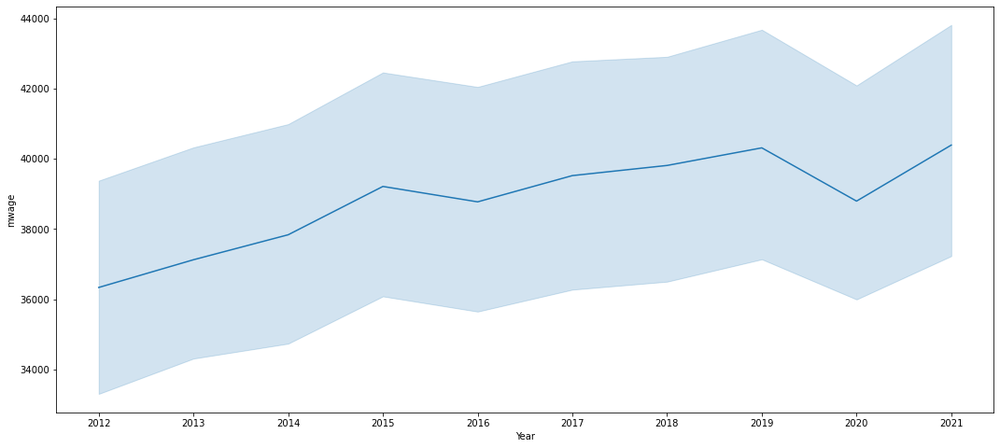

In [125]:
plt.figure(figsize=(18,8))

sns.lineplot(x='Year',y='mwage',data=df2)
plt.show()

`Description`

- Beginning in 2012, the trend was upward and continued to rise through 2014.
- The trend peaked in 2015 before declining in 2016.
- Similar to the motion in 2012, the trend was higher.
- As 2020 approached, the trend declined in 2019. However, it increased later, in 2021.

In [128]:
plotHeatmap(df2,'area')

`Description`

- From the first 3 areas, Northumb in 2012 had the highest wages, followed by Durham (County), and Cumbria had the highest minimum wages over the years .

- We can also see Northumb in 2012 had high wages but declined as the years pass by till after 2020 where it took up again.
- From the first 3 areas, Staffordshire  and Merseyside (Met County) had the lowest minimum wages over the years.

- Wiltshire, Hertfordshire, and are continuosly increasing the minimum wage over the years.

In [241]:
# import plotly.express as px
# # .sort_values('mwage', ascending=False)
# fig = px.box(df2, x="mwage", y="area",
#              height=700)

# # fig.update_xaxes(tickangle=40)
# fig.update_traces(orientation='h' )

# fig.update_layout(
#     margin=dict(l=20, r=20, t=20, b=20),
#     boxgap=0.5,
# #      xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
# #     yaxis=dict(zeroline=False, gridcolor='white'),
# #     paper_bgcolor='rgb(233,233,233)',
# #     plot_bgcolor='rgb(233,233,233)',
# #     paper_bgcolor="LightSteelBlue",
# )
# fig.show()

plotBoxplot(df2, x='mwage', y='area')
plotPie(df2, x='area', y='mwage',t=' ')

On here we were concerned about the areas and their minimum wages.

- From the first 3, we can see Outer london had the highest pay , followed by inner london, Greater manchester and  West Midlands.



# BEFORE

### To investigate the relationship on the hourly pay before and after the COVID-19 Pandemic in annual survey of hours and earnings



In [243]:
# lets work on the Hourly pay on areas
uk_area_years_df =uk_df.set_index('area')
uk_area_years_df = uk_area_years_df.drop(index=(uk)).reset_index()
uk_area_years_df.head()


,area,state,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Durham (County),England,ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5
1,Northumb,England,ecounty,Male,basic,Full Time,Weekly,49000.0,6.0,48000.0,...,47000.0,6.3,49000.0,6.3,45000.0,6.6,41000.0,8.0,45000.0,7.4
2,Tyne and Wear (Met County),England,ecounty,Male,basic,Full Time,Weekly,182000.0,3.0,179000.0,...,184000.0,3.2,181000.0,3.2,180000.0,3.2,172000.0,3.8,174000.0,3.8
3,Cumbria,England,ecounty,Male,basic,Full Time,Weekly,87000.0,4.5,86000.0,...,88000.0,4.6,91000.0,4.5,95000.0,4.5,93000.0,5.2,97000.0,5.0
4,Greater Manchester (Met County),England,ecounty,Male,basic,Full Time,Weekly,405000.0,2.0,412000.0,...,446000.0,2.0,441000.0,2.0,457000.0,2.0,395000.0,2.5,417000.0,2.4


In [244]:
uk_area_years_df[['work_standard', 'work_time','2020_pay']][:10]

,work_standard,work_time,2020_pay
0,Full Time,Weekly,76000.0
1,Full Time,Weekly,41000.0
2,Full Time,Weekly,172000.0
3,Full Time,Weekly,93000.0
4,Full Time,Weekly,395000.0
5,Full Time,Weekly,183000.0
6,Full Time,Weekly,196000.0
7,Full Time,Weekly,101000.0
8,Full Time,Weekly,212000.0
9,Full Time,Weekly,381000.0


In [245]:
uk_df

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
1,Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
2,Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
3,Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
4,England,Durham (County),ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3116,England,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,0.8,10.0,0.8,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
3117,England,Essex,ecounty,Female,overtime,Part Time,Hours,0.6,14.0,0.7,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
3118,England,Outer London,ecounty,Female,overtime,Part Time,Hours,0.8,7.7,0.7,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9
3119,England,Hampshire,ecounty,Female,overtime,Part Time,Hours,0.6,12.0,0.5,...,0.5,14.0,0.5,15.0,0.5,14.0,0.5,17.0,0.5,14.0


In [246]:
uk_df.query("work_standard == 'Part Time'")# and year == 2007 and pop > 2.e6")

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
788,England,England,country,Male,gross,Part Time,Weekly,1405000.0,1.0,1418000.0,...,1533000.0,0.9,1619000.0,0.9,1608000.0,0.9,1615000.0,1.1,1664000.0,1.1
789,Wales,Wales,country,Male,gross,Part Time,Weekly,74000.0,4.7,68000.0,...,76000.0,4.6,88000.0,4.4,85000.0,4.5,78000.0,5.5,88000.0,5.0
790,Scotland,Scotland,country,Male,gross,Part Time,Weekly,143000.0,3.3,136000.0,...,148000.0,3.3,165000.0,3.2,159000.0,3.2,146000.0,4.0,149000.0,3.8
791,Northern Ireland,Northern Ireland,country,Male,gross,Part Time,Weekly,64000.0,5.1,55000.0,...,64000.0,5.1,64000.0,5.1,67000.0,5.1,81000.0,5.4,83000.0,5.2
792,England,Durham (County),ecounty,Male,gross,Part Time,Weekly,14000.0,10.7,12000.0,...,12000.0,12.2,13000.0,11.5,13000.0,11.6,12000.0,14.6,14000.0,13.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3116,England,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,0.8,10.0,0.8,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
3117,England,Essex,ecounty,Female,overtime,Part Time,Hours,0.6,14.0,0.7,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
3118,England,Outer London,ecounty,Female,overtime,Part Time,Hours,0.8,7.7,0.7,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9
3119,England,Hampshire,ecounty,Female,overtime,Part Time,Hours,0.6,12.0,0.5,...,0.5,14.0,0.5,15.0,0.5,14.0,0.5,17.0,0.5,14.0


In [247]:
uk_area_years_df['work_standard'].unique()

array(['Full Time', 'Part Time'], dtype=object)

In [248]:
by_worktime = uk_area_years_df.groupby(["work_time",'work_standard'])

In [249]:
for state, frame in by_worktime:
    print(f"First 2 entries for {state!r}")
    print("------------------------")
    print(frame.head(2), end="\n\n")

First 2 entries for ('Hourly', 'Full Time')
------------------------
               area    state area_type   sex pay_standard work_standard  \
37  Durham (County)  England   ecounty  Male        gross     Full Time   
38         Northumb  England   ecounty  Male        gross     Full Time   

   work_time  2012_pay  2012_conf%  2013_pay  ...  2017_pay  2017_conf%  \
37    Hourly   84000.0         4.5   81000.0  ...   85000.0         4.6   
38    Hourly   49000.0         6.0   48000.0  ...   47000.0         6.3   

    2018_pay  2018_conf%  2019_pay  2019_conf%  2020_pay  2020_conf%  \
37   90000.0         4.6   92000.0         4.6   76000.0         5.8   
38   49000.0         6.3   45000.0         6.6   41000.0         8.0   

    2021_pay  2021_conf%  
37   88000.0         5.5  
38   45000.0         7.4  

[2 rows x 27 columns]

First 2 entries for ('Hourly', 'Part Time')
------------------------
                area    state area_type   sex pay_standard work_standard  \
783  Durham 

In [250]:
['Full Time', 'Part Time']

['Full Time', 'Part Time']

### 'Full Time'

In [255]:

# drill down to the sub-table
fulltimehourly_df = by_worktime.get_group(("Hourly",'Full Time'))
fulltimehourly_df.head()

,area,state,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
37,Durham (County),England,ecounty,Male,gross,Full Time,Hourly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5
38,Northumb,England,ecounty,Male,gross,Full Time,Hourly,49000.0,6.0,48000.0,...,47000.0,6.3,49000.0,6.3,45000.0,6.6,41000.0,8.0,45000.0,7.4
39,Tyne and Wear (Met County),England,ecounty,Male,gross,Full Time,Hourly,182000.0,3.0,179000.0,...,184000.0,3.2,181000.0,3.2,180000.0,3.2,172000.0,3.8,174000.0,3.8
40,Cumbria,England,ecounty,Male,gross,Full Time,Hourly,87000.0,4.5,86000.0,...,88000.0,4.6,91000.0,4.5,95000.0,4.5,93000.0,5.2,97000.0,5.0
41,Greater Manchester (Met County),England,ecounty,Male,gross,Full Time,Hourly,405000.0,2.0,412000.0,...,446000.0,2.0,441000.0,2.0,457000.0,2.0,395000.0,2.5,417000.0,2.4


In [256]:
# get area and all the years pay columns
plot_col_pay = ['area', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay']
fulltimehourly_area_df = fulltimehourly_df[plot_col_pay]

In [257]:
fulltimehourly_area_df

,area,2012_pay,2013_pay,2014_pay,2015_pay,2016_pay,2017_pay,2018_pay,2019_pay,2020_pay,2021_pay
37,Durham (County),84000.0,81000.0,84000.0,87000.0,81000.0,85000.0,90000.0,92000.0,76000.0,88000.0
38,Northumb,49000.0,48000.0,47000.0,45000.0,46000.0,47000.0,49000.0,45000.0,41000.0,45000.0
39,Tyne and Wear (Met County),182000.0,179000.0,181000.0,191000.0,183000.0,184000.0,181000.0,180000.0,172000.0,174000.0
40,Cumbria,87000.0,86000.0,85000.0,89000.0,89000.0,88000.0,91000.0,95000.0,93000.0,97000.0
41,Greater Manchester (Met County),405000.0,412000.0,421000.0,427000.0,429000.0,446000.0,441000.0,457000.0,395000.0,417000.0
...,...,...,...,...,...,...,...,...,...,...,...
1997,Surrey,17.7,17.12,17.38,17.69,18.28,18.69,19.46,19.89,20.4,20.32
1998,West Sussex,13.64,13.74,13.77,14.23,14.69,14.55,15.35,16.54,15.84,17.01
1999,Devon,11.87,11.62,12.37,12.63,13.0,13.5,13.67,14.71,15.27,15.45
2000,Somerset,12.69,13.11,12.88,13.17,13.33,13.36,13.54,14.89,14.95,15.63


In [258]:
df2= fulltimehourly_area_df.melt(id_vars=["area"],
        var_name="Year", 
        value_name="mwage")


In [259]:
df2.area.unique()

array(['Durham (County)', 'Northumb', 'Tyne and Wear (Met County)',
       'Cumbria', 'Greater Manchester (Met County)', 'Lancashire',
       'Merseyside (Met County)', 'North Yorkshire',
       'South Yorkshire (Met County)', 'West Yorkshire (Met County)',
       'Derbyshire', 'Leicestershire', 'Lincolnshire', 'Nottinghamshire',
       'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Cambridgeshire',
       'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London',
       'Outer London', 'Buckinghamshire', 'East Sussex', 'Hampshire',
       'Kent', 'Oxfordshire', 'Surrey', 'West Sussex', 'Devon',
       'Gloucestershire', 'Somerset', 'Wiltshire'], dtype=object)

In [260]:
plotHeatmap(df2, 'area')

`Description`

- From the first 3 areas, Inner London , followed by Surrey, and Hertfordshire had the highest minimum wages over the years. And are continuosly increasing the minimum wage over the years.

- We can also see Inner London in 2012 had low wages but rise as the years pass by till.

- From the first 3 areas, Gloucestershire, Devon and Durham (Met County) had the lowest minimum wages over the years.



In [261]:
plotBoxplot(df2, x='mwage', y='area')
# plotPie(df2, x='area', y='mwage')
plotPie(df2, 'area', 'mwage', '2012-2021')

On here we were concerned about the areas and their minimum wages.

In terms of Full time

- From the first 3, we can still see that Outer london had the highest pay , followed by inner london, Greater manchester and  West Midlands.
- Northumb, shropshire and East Sussex were the last three most least paid areas.

### 'Part Time'

In [262]:
# drill down to the sub-table
parttimehourly_df = by_worktime.get_group(("Hourly",'Part Time'))
parttimehourly_df.head()

,area,state,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
783,Durham (County),England,ecounty,Male,gross,Part Time,Hourly,14000.0,10.7,12000.0,...,12000.0,12.2,13000.0,11.5,13000.0,11.6,12000.0,14.6,14000.0,13.3
784,Northumb,England,ecounty,Male,gross,Part Time,Hourly,7000.0,15.4,8000.0,...,7000.0,15.5,9000.0,14.1,7000.0,16.4,8000.0,17.4,8000.0,17.0
785,Tyne and Wear (Met County),England,ecounty,Male,gross,Part Time,Hourly,27000.0,7.7,29000.0,...,34000.0,6.9,30000.0,7.5,33000.0,7.1,29000.0,9.2,32000.0,8.6
786,Cumbria,England,ecounty,Male,gross,Part Time,Hourly,14000.0,10.6,14000.0,...,15000.0,10.5,14000.0,10.9,14000.0,11.0,13000.0,13.9,14000.0,13.2
787,Greater Manchester (Met County),England,ecounty,Male,gross,Part Time,Hourly,77000.0,4.6,74000.0,...,78000.0,4.5,80000.0,4.6,80000.0,4.6,78000.0,5.5,83000.0,5.2


In [263]:
plot_col_pay = ['area', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay']
parttime_area_hourly_df = parttimehourly_df[plot_col_pay]

In [264]:
parttime_area_hourly_df

,area,2012_pay,2013_pay,2014_pay,2015_pay,2016_pay,2017_pay,2018_pay,2019_pay,2020_pay,2021_pay
783,Durham (County),14000.0,12000.0,11000.0,12000.0,12000.0,12000.0,13000.0,13000.0,12000.0,14000.0
784,Northumb,7000.0,8000.0,7000.0,8000.0,7000.0,7000.0,9000.0,7000.0,8000.0,8000.0
785,Tyne and Wear (Met County),27000.0,29000.0,34000.0,31000.0,31000.0,34000.0,30000.0,33000.0,29000.0,32000.0
786,Cumbria,14000.0,14000.0,14000.0,15000.0,13000.0,15000.0,14000.0,14000.0,13000.0,14000.0
787,Greater Manchester (Met County),77000.0,74000.0,82000.0,78000.0,77000.0,78000.0,80000.0,80000.0,78000.0,83000.0
...,...,...,...,...,...,...,...,...,...,...,...
2712,West Sussex,11.11,11.49,11.86,11.89,12.14,12.6,12.78,13.78,14.43,14.24
2713,Devon,11.14,11.5,11.72,11.54,11.96,12.39,12.6,12.74,13.34,13.82
2714,Gloucestershire,11.19,11.24,11.4,11.34,12.11,11.93,12.33,13.05,13.68,13.46
2715,Somerset,10.16,10.08,10.27,10.13,10.61,11.11,11.76,12.29,12.71,13.34


In [271]:
df2= parttime_area_hourly_df.melt(id_vars=["area"],
        var_name="Year", 
        value_name="mwage")


In [272]:
df2.area.unique()

array(['Durham (County)', 'Northumb', 'Tyne and Wear (Met County)',
       'Cumbria', 'Greater Manchester (Met County)', 'Lancashire',
       'Merseyside (Met County)', 'North Yorkshire',
       'South Yorkshire (Met County)', 'West Yorkshire (Met County)',
       'Derbyshire', 'Leicestershire', 'Lincolnshire', 'Nottinghamshire',
       'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Cambridgeshire',
       'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London',
       'Outer London', 'Buckinghamshire', 'East Sussex', 'Hampshire',
       'Kent', 'Oxfordshire', 'Surrey', 'West Sussex', 'Devon',
       'Gloucestershire', 'Somerset', 'Wiltshire'], dtype=object)

In [273]:
plotHeatmap(df2, 'area')

`Description`

- From the first 3 areas, Surrey , followed by Buckinghamshire, and Warwickshire had the highest minimum wages over the years .

- From the first 3 areas, Staffordshire  and Merseyside (Met County) had the lowest minimum wages over the years.

- Warwickshire continuosly increasing the minimum wage over the years.



Minimum Wage Distribution

In [274]:
# plotBoxplot(df2, 'area')

In [275]:
plotBoxplot(df2, x='mwage', y='area')
plotPie(df2, 'area', 'mwage','Partime -> 2012-2021')

On here we were concerned about the areas and their minimum wages.

In terms of Part time

- From the first 3, we can still see that Outer london had the highest pay , followed by Greater Manchester(Met County), and Inner london.

- Northumb, shropshire and Durham were the last three most least paid areas.

### END OF FULL DATA EDA --AREA

# Can we compare the hourly pay of part time and full-time workers in the UK, before and after the COVID 19 pandemic?

### Here we focus on the UK, i.e  England ,  Wales ,  Scotland ,  Northern Ireland 

## START state

Here we focused on the state using the area

In [276]:
uk_df

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
1,Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
2,Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
3,Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
4,England,Durham (County),ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3116,England,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,0.8,10.0,0.8,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
3117,England,Essex,ecounty,Female,overtime,Part Time,Hours,0.6,14.0,0.7,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
3118,England,Outer London,ecounty,Female,overtime,Part Time,Hours,0.8,7.7,0.7,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9
3119,England,Hampshire,ecounty,Female,overtime,Part Time,Hours,0.6,12.0,0.5,...,0.5,14.0,0.5,15.0,0.5,14.0,0.5,17.0,0.5,14.0


In [277]:
uk_state_years_df =uk_df.copy()#.set_index('state')
# uk_state_years_df = uk_state_years_df.drop(index=(uk)).reset_index()
uk_state_years_df.head()


,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
1,Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
2,Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
3,Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
4,England,Durham (County),ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5


In [278]:
# group by the work time and standard
by_worktime = uk_state_years_df.groupby(["work_time",'work_standard'])

In [279]:
for state, frame in by_worktime:
    print(f"First 2 entries for {state!r}")
    print("------------------------")
    print(frame.head(2), end="\n\n")

First 2 entries for ('Hourly', 'Full Time')
------------------------
      state     area area_type   sex pay_standard work_standard work_time  \
41  England  England   country  Male        gross     Full Time    Hourly   
42    Wales    Wales   country  Male        gross     Full Time    Hourly   

     2012_pay  2012_conf%   2013_pay  ...   2017_pay  2017_conf%   2018_pay  \
41  8778000.0         0.2  8895000.0  ...  9502000.0         0.2  9483000.0   
42   466000.0         1.9   473000.0  ...   487000.0         1.9   489000.0   

    2018_conf%   2019_pay  2019_conf%   2020_pay  2020_conf%   2021_pay  \
41         0.2  9508000.0         0.2  9117000.0         0.3  9570000.0   
42         1.9   492000.0         1.9   484000.0         2.2   504000.0   

    2021_conf%  
41         0.3  
42         2.2  

[2 rows x 27 columns]

First 2 entries for ('Hourly', 'Part Time')
------------------------
       state     area area_type   sex pay_standard work_standard work_time  \
870  England 

get full time and part time dataframes

In [280]:

# drill down to the sub-table
fulltimehourly_df = by_worktime.get_group(("Hourly",'Full Time'))
fulltimehourly_df.head()

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
41,England,England,country,Male,gross,Full Time,Hourly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
42,Wales,Wales,country,Male,gross,Full Time,Hourly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
43,Scotland,Scotland,country,Male,gross,Full Time,Hourly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
44,Northern Ireland,Northern Ireland,country,Male,gross,Full Time,Hourly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
45,England,Durham (County),ecounty,Male,gross,Full Time,Hourly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5


In [281]:

# drill down to the sub-table
# For Parttime
parttimehourly_df = by_worktime.get_group(("Hourly",'Part Time'))
parttimehourly_df.head()


,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
870,England,England,country,Male,gross,Part Time,Hourly,1405000.0,1.0,1418000.0,...,1533000.0,0.9,1619000.0,0.9,1608000.0,0.9,1615000.0,1.1,1664000.0,1.1
871,Wales,Wales,country,Male,gross,Part Time,Hourly,74000.0,4.7,68000.0,...,76000.0,4.6,88000.0,4.4,85000.0,4.5,78000.0,5.5,88000.0,5.0
872,Scotland,Scotland,country,Male,gross,Part Time,Hourly,143000.0,3.3,136000.0,...,148000.0,3.3,165000.0,3.2,159000.0,3.2,146000.0,4.0,149000.0,3.8
873,Northern Ireland,Northern Ireland,country,Male,gross,Part Time,Hourly,64000.0,5.1,55000.0,...,64000.0,5.1,64000.0,5.1,67000.0,5.1,81000.0,5.4,83000.0,5.2
874,England,Durham (County),ecounty,Male,gross,Part Time,Hourly,14000.0,10.7,12000.0,...,12000.0,12.2,13000.0,11.5,13000.0,11.6,12000.0,14.6,14000.0,13.3


## 2012 to 2019

### 'Full Time'

In [282]:
# desired years
plot_col_pay = ['state', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay']

fulltime_state_uk_hourly_df = fulltimehourly_df[plot_col_pay]

In [283]:
fulltime_state_uk_hourly_df['state'].unique()

array(['England', 'Wales', 'Scotland', 'Northern Ireland'], dtype=object)

In [284]:
df2= fulltime_state_uk_hourly_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])
# df2['Year'] = pd.to_datetime(df2['Year'].apply(lambda x: x.split('_')[0]))
df2

,state,Year,mwage
0,England,2012,8778000.0
1,Wales,2012,466000.0
2,Scotland,2012,907000.0
3,Northern Ireland,2012,306000.0
4,England,2012,84000.0
...,...,...,...
3915,England,2019,19.89
3916,England,2019,16.54
3917,England,2019,14.71
3918,England,2019,14.89


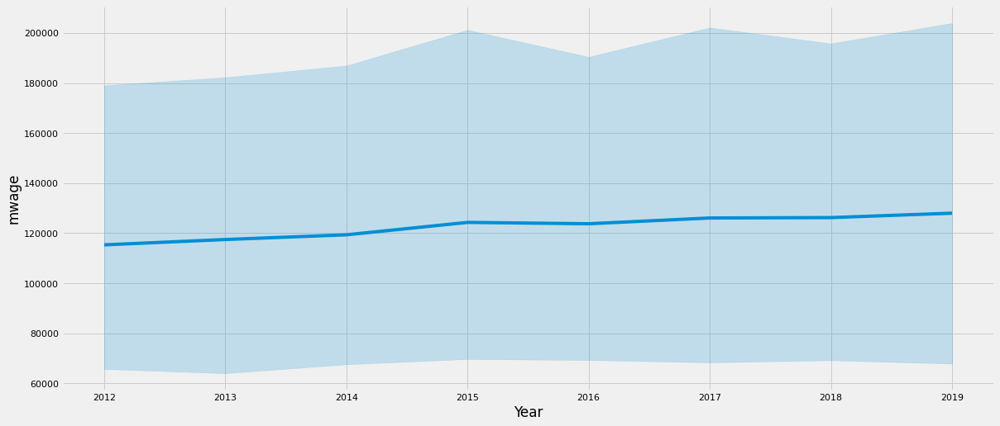

In [285]:
plt.figure(figsize=(18,8))

sns.lineplot(x='Year',y='mwage',data=df2)
plt.show()

`Description`

From 2012, the minimum wages went high up at 2015.

It then increased in 2015 and continued to rise until 2019.

In [286]:
plotHeatmap(df2, 'state')

`Description`

- The minimum wage in Scotland and Wales has steadily increased over the years.

- And also, Northern Ireland and Wales had the lowest minimum wages among the other states over the years.

- Wages in England fell in 2014 before rising again in 2015.

- Prior to COVID (2020), the minimum wage in Scotland in 2019 was higher than in Wales, Northern Ireland, and England, a trend that would last until the following year.


Minimum Wage Distribution

In [295]:
plotBoxplot(df2, 'mwage','state')
plotPie(df, 'state','mwage','2012 to 2019')

`Description`
- From the boxplot we could see England's is comparatively short. This suggests that overall population have a high level of minimum wage with each other. 

- Scotland, Wales, and Northern Ireland box plot is comparatively tall. This suggests these states hold quite different opinions about their minimum wages. 

- Northern Ireland and Wales have similar medians (which are generally close to the average). Scotland had the highest median, followed by Endland.

### 'Part Time'

In [300]:
# desired years

plot_col_pay = ['state', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay']
parttime_uk_hourly_df = parttimehourly_df[plot_col_pay]

In [301]:
df2= parttime_uk_hourly_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])
df2['Year'] = pd.to_datetime(df2['Year'].apply(lambda x: x.split('_')[0]))
df2

,state,Year,mwage
0,England,2012-01-01,1405000.0
1,Wales,2012-01-01,74000.0
2,Scotland,2012-01-01,143000.0
3,Northern Ireland,2012-01-01,64000.0
4,England,2012-01-01,14000.0
...,...,...,...
3819,England,2019-01-01,13.78
3820,England,2019-01-01,12.74
3821,England,2019-01-01,13.05
3822,England,2019-01-01,12.29


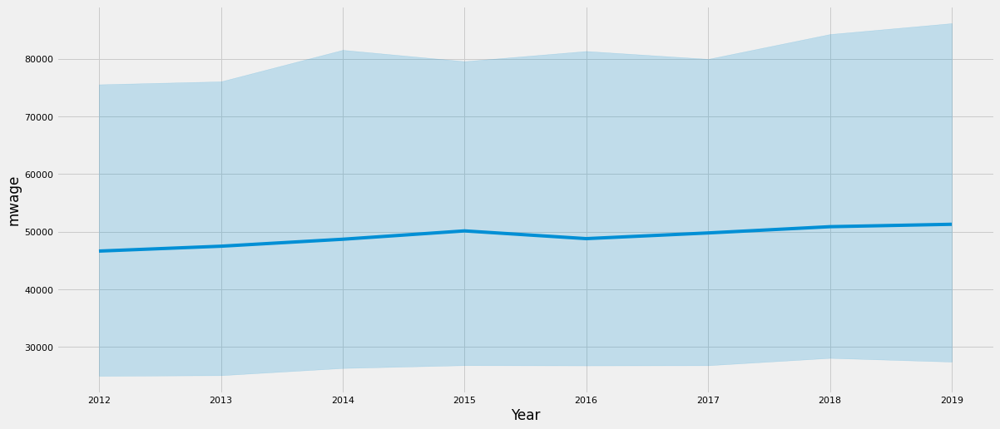

In [302]:
plt.figure(figsize=(18,8))

sns.lineplot(x='Year',y='mwage',data=df2)
plt.show()

`Description`

From 2012 to 2015, the minimum wage was reduced.

It then rose in 2016 and continued to grow slowly until 2019.

In [303]:
plotHeatmap(df2, 'state')

`Description`

**For Parttime**

- The minimum wage in all the state has steadily increased over the years.

- England, followed by Scotland, had the highest minimum wages among the first three states over the years.

- And also, Wales and Northern Ireland had the lowest minimum wages among the other states over the years.

- The minimum wages of Northern Ireland fell in 2015 before rising again in 2015 in a steadily increasing pace over the years.

- Prior to COVID (2020), the minimum wage of England in 2019 was higher than in Scotland, Wales and Northern Ireland, a trend that would last until the following year.


Minimum Wage Distribution

In [308]:
plotBoxplot(df2, x='mwage', y='state')
plotPie(df, x='state', y='mwage', t='2012 to 2019')

`Description`

The analysis looks similar to that of the PArt time

- The four sections of the box plot are of varying sizes; see England. This demonstrates that many states have similar minimum wages at certain points on the scale, but at other points on the scale, the states' wages are more variable. 

- All the states box plot are comparatively tall. This suggests these states hold quite different opinions about their minimum wages. 

- Northern Ireland and Wales have similar medians (which are generally close to the average). England had the highest median.

# During covid

## focus on 2020

### "Full Time"

In [309]:
fulltimehourly_df.state.unique()

array(['England', 'Wales', 'Scotland', 'Northern Ireland'], dtype=object)

Confidence Interval (CI) provides us with a range of values that we are fairly sure will include the true population value, such as a mean or proportion.

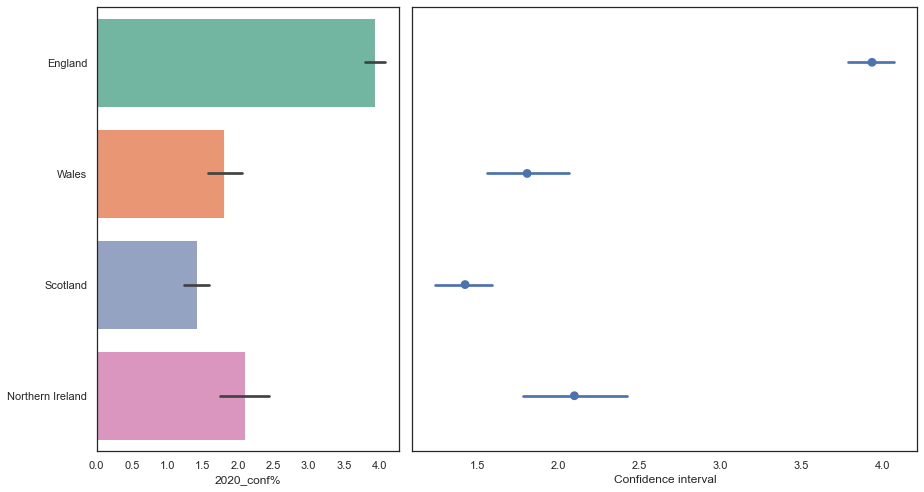

In [310]:
plotBarplotPointPlot(fulltimehourly_df, '2020_conf%', 'state')

`Description`

- From the 4 states, England had the highest confidence interval in 2020, followed by the Northern Ireland, Wales and Scotland in that order.

- Northern Ireland interval was very close to that of Wales.

In [311]:
hourly_state_df = fulltimehourly_df[['state', '2020_pay',]]

In [312]:
hourly_state_df

,state,2020_pay
41,England,9117000.0
42,Wales,484000.0
43,Scotland,859000.0
44,Northern Ireland,414000.0
45,England,76000.0
...,...,...
2225,England,20.4
2226,England,15.84
2227,England,15.27
2228,England,14.95


In [313]:
df2= hourly_state_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")
df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])


In [314]:
plotHeatmap(df2, 'state')

`Description`

- Scotland had the highest pay in 2020. Next was England , followed by Northern Ireland then the Wales.

Minimum Wage Distribution

In [317]:
plotBoxplot(df2, x='mwage', y='state')
plotPie(df, x='state', y='mwage', t='2020')

`Description`

The analysis looks similar to that of the full time

- The four sections of the box plot are of varying sizes; see that of Scotland. This demonstrates that many states have similar minimum wages at certain points on the scale, but at other points on the scale, the states' wages are more variable. 

- Because the England boxplot is longer than the others, it indicates a wider range of data values in that section (meaning the data are more spread out). And we can see the wide distribution of outliers behind them.

- Because the sides of the box represent the first and third quartiles, Scotland has a larger interquartile range. This is an indication of potentially untrustworthy data.

### "part Time"

In [318]:
parttimehourly_df.state.unique()

array(['England', 'Wales', 'Scotland', 'Northern Ireland'], dtype=object)

Confidence Interval (CI) provides us with a range of values that we are fairly sure will include the true population value, such as a mean or proportion.

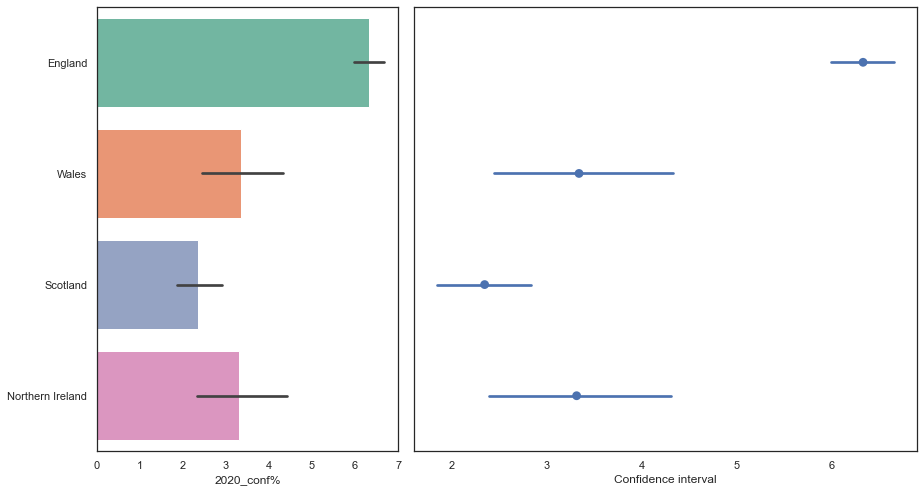

In [319]:
plotBarplotPointPlot(parttimehourly_df, '2020_conf%', 'state')

`Description`

- From the 4 states, England had the highest confidence interval in 2020, followed by Wales,  Northern Ireland and Scotland in that order.

- Wales interval was very close to that of Northern Ireland.

In [320]:
hourly_state_df = parttimehourly_df[['state', '2020_pay',]]

In [321]:
hourly_state_df

,state,2020_pay
870,England,1615000.0
871,Wales,78000.0
872,Scotland,146000.0
873,Northern Ireland,81000.0
874,England,12000.0
...,...,...
3022,England,14.43
3023,England,13.34
3024,England,13.68
3025,England,12.71


In [322]:
df2= hourly_state_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")
df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])


In [323]:
plotHeatmap(df2, 'state')

`Description`

- England had the highest minimum wage, followed by Scotland, Wales, and Northern Ireland.

- And also, Northern Ireland and Wales had the lowest minimum wages among the other states in 2020.


Minimum Wage Distribution

In [325]:
plotBoxplot(df2, x='mwage', y='state')
plotPie(df, x='state', y='mwage', t='2020')

`Description`


- The four sections of the box plot are of varying sizes; see that of Scotland. This demonstrates that many states have similar minimum wages at certain points on the scale, but at other points on the scale, the states' wages are more variable. 

- Because the sides of the box represent the first and third quartiles, Scotland has a larger interquartile range. This is an indication of potentially untrustworthy data.

- Because the England boxplot is longer than the others, it indicates a wider range of data values in that section (meaning the data are more spread out). And we can see the a few distribution of outliers behind them.

- Wales and Northern Ireland have smaller boxplot sections, indicating that the data are more condensed (closer together).
---



## 2021

### After covid

focus on 2021

### 'Full Time'

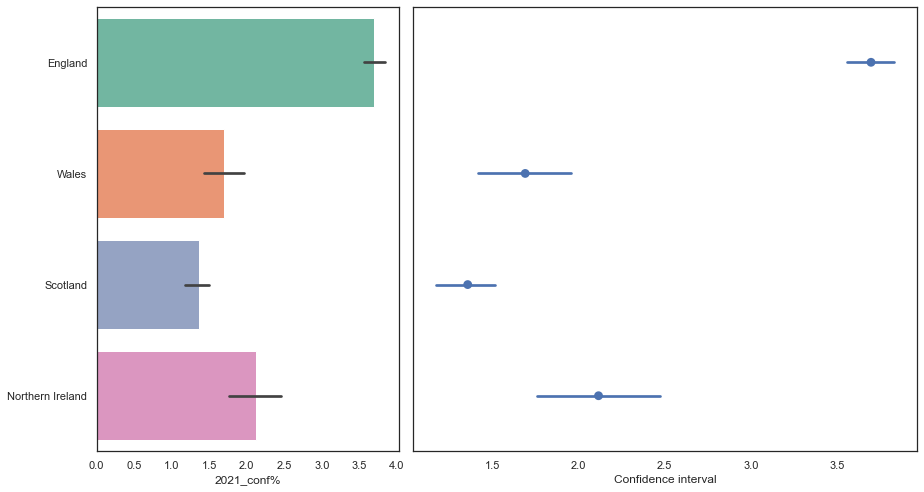

In [326]:
plotBarplotPointPlot(fulltimehourly_df, '2021_conf%', 'state')

`Description`

- England had the highest confidence interval of the four states, giving us a more precise idea of the range of values that could contain the true population mean in 2021. Then, in that order, Northern Ireland, Wales, and Scotland.

In [327]:
# get the desired year and state
hourly_state_df = fulltimehourly_df[['state', '2021_pay',]]

In [328]:
hourly_state_df

,state,2021_pay
41,England,9570000.0
42,Wales,504000.0
43,Scotland,906000.0
44,Northern Ireland,448000.0
45,England,88000.0
...,...,...
2225,England,20.32
2226,England,17.01
2227,England,15.45
2228,England,15.63


In [329]:
df2= hourly_state_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])


In [330]:
plotHeatmap(df2, 'state')

`Description`

- From the 4 states, Scotland , followed by England, Northern Ireland ,and Wales had the highest minimum wages in 2021.

- From the plot, we can also see England surpassed Northern Ireland with a difference of 0.35.


Minimum Wage Distribution

In [335]:
plotBoxplot(df2, x='mwage', y='state')
# sns.relplot(x='state',y='mwage',data=df2)

plotPie(df, x='state', y='mwage', t='2021 Full time')

`Description`

- The four sections of the box plot are of varying sizes; see that of Scotland. This demonstrates that many states have similar minimum wages at certain points on the scale, but at other points on the scale, the states' wages are more variable. This seem to look similar like that of 2020.

- The sides of the box represent the first and third quartiles, Scotland has a larger interquartile range. This is an indication of potentially untrustworthy data.

- Because the England boxplot is longer than the others, it indicates a wider spread of data. And we can see the a few distribution of outliers behind them.


### 'Part Time'

In [336]:
parttimehourly_df

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
870,England,England,country,Male,gross,Part Time,Hourly,1405000.0,1.0,1418000.0,...,1533000.0,0.9,1619000.0,0.9,1608000.0,0.9,1615000.0,1.1,1664000.0,1.1
871,Wales,Wales,country,Male,gross,Part Time,Hourly,74000.0,4.7,68000.0,...,76000.0,4.6,88000.0,4.4,85000.0,4.5,78000.0,5.5,88000.0,5.0
872,Scotland,Scotland,country,Male,gross,Part Time,Hourly,143000.0,3.3,136000.0,...,148000.0,3.3,165000.0,3.2,159000.0,3.2,146000.0,4.0,149000.0,3.8
873,Northern Ireland,Northern Ireland,country,Male,gross,Part Time,Hourly,64000.0,5.1,55000.0,...,64000.0,5.1,64000.0,5.1,67000.0,5.1,81000.0,5.4,83000.0,5.2
874,England,Durham (County),ecounty,Male,gross,Part Time,Hourly,14000.0,10.7,12000.0,...,12000.0,12.2,13000.0,11.5,13000.0,11.6,12000.0,14.6,14000.0,13.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3022,England,West Sussex,ecounty,Female,excluding overtime,Part Time,Hourly,11.11,2.6,11.49,...,12.6,2.8,12.78,2.6,13.78,3.3,14.43,3.7,14.24,2.7
3023,England,Devon,ecounty,Female,excluding overtime,Part Time,Hourly,11.14,3.1,11.5,...,12.39,3.4,12.6,3.0,12.74,2.9,13.34,3.4,13.82,3.0
3024,England,Gloucestershire,ecounty,Female,excluding overtime,Part Time,Hourly,11.19,3.2,11.24,...,11.93,2.9,12.33,3.1,13.05,2.9,13.68,4.7,13.46,4.7
3025,England,Somerset,ecounty,Female,excluding overtime,Part Time,Hourly,10.16,3.6,10.08,...,11.11,3.4,11.76,3.7,12.29,2.8,12.71,3.3,13.34,2.8


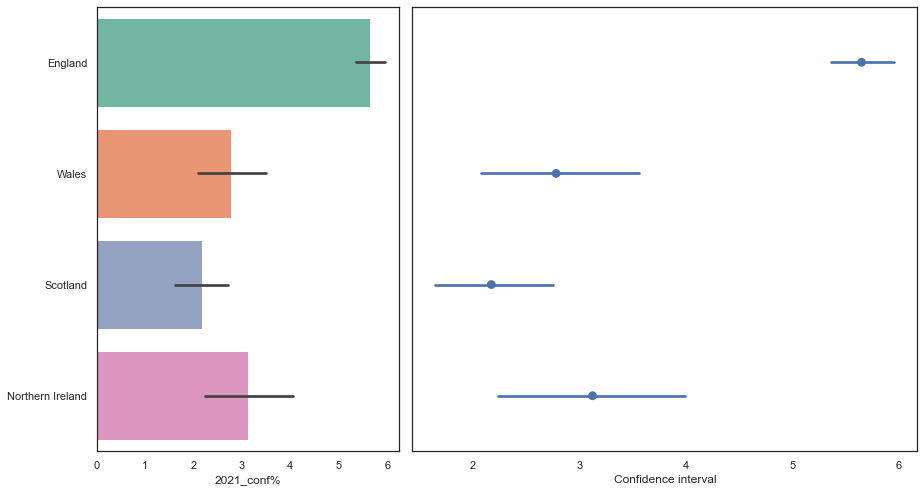

In [337]:
plotBarplotPointPlot(parttimehourly_df, '2021_conf%', 'state')

`Description`

- England had the highest confidence interval of the four states, giving us a more precise idea of the range of values that could contain the true population mean in 2021. Then, in that order, Northern Ireland, Wales, and Scotland.

In [338]:
hourly_state_df = parttimehourly_df[['state', '2021_pay',]]

In [339]:
hourly_state_df

,state,2021_pay
870,England,1664000.0
871,Wales,88000.0
872,Scotland,149000.0
873,Northern Ireland,83000.0
874,England,14000.0
...,...,...
3022,England,14.24
3023,England,13.82
3024,England,13.46
3025,England,13.34


In [342]:
df2= hourly_state_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])


In [343]:
plotHeatmap(df2, 'state')

`Description`

- From the 4 states, England , followed by Scotland had the highest minimum wages in 2021.

- Northern Ireland and Wales had the lowest minimum wages in 2021.

- From the plot, we can also see England surpassed Scotland with a difference of 0.05.

- We could also see that Northern Ireland surpassed wales with a difference of 0.11 which we can see from the confidence interval.


Minimum Wage Distribution

In [344]:
plotBoxplot(df2, x='mwage', y='state')
plotPie(df, x='state', y='mwage', t='2021 Part time')

`Description`

The analysis looks similar to that of the full time


- The four sections of the box plot are of varying sizes; see that of Scotland. This demonstrates that many states have similar minimum wages at certain points on the scale, but at other points on the scale, the states' wages are more variable. This seem to look similar like that of 2020.


- The sides of the box represent the first and third quartiles, Scotland has a larger interquartile range. This is an indication of potentially untrustworthy data.


- Because the England boxplot is longer than the others, it indicates a wider spread of data. And we can see the a few distribution of outliers behind them.


# Has the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK?

 <img src="https://www.machinelearningplus.com/wp-content/uploads/2020/05/800px-Waterfall-chart-min.jpg" />

A waterfall chart, which is a 2D plot, is used to comprehend the effects of adding positive or negative values over time, over a number of steps, or for a variable.

Financial analysis frequently uses waterfall charts to comprehend the gain and loss contributions of various factors over a specific asset. But in our case, we want to know how the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK.

In [345]:
by_all_worktime = uk_state_years_df.groupby(["work_time",])

In [346]:
# drill down to the sub-table
full_part_time_hourly_df = by_all_worktime.get_group("Hourly")
full_part_time_hourly_df.head()

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
41,England,England,country,Male,gross,Full Time,Hourly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
42,Wales,Wales,country,Male,gross,Full Time,Hourly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
43,Scotland,Scotland,country,Male,gross,Full Time,Hourly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
44,Northern Ireland,Northern Ireland,country,Male,gross,Full Time,Hourly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
45,England,Durham (County),ecounty,Male,gross,Full Time,Hourly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5


In [347]:
full_part_time_hourly_df.work_standard.unique()

array(['Full Time', 'Part Time'], dtype=object)

In [348]:
full_part_time_hourly_df.columns

Index(['state', 'area', 'area_type', 'sex', 'pay_standard', 'work_standard',
       'work_time', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay',
       '2021_conf%'],
      dtype='object')

In [349]:
plot_col_pay = ['2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay']

waterfall_uk_hourly_df = full_part_time_hourly_df[plot_col_pay]

waterfall_uk_hourly_df.columns = [x.split('_')[0] for x in plot_col_pay]

In [350]:
waterfall_uk_hourly_df

,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
41,8778000.0,8895000.0,9016000.0,9362000.0,9312000.0,9502000.0,9483000.0,9508000.0,9117000.0,9570000.0
42,466000.0,473000.0,479000.0,500000.0,487000.0,487000.0,489000.0,492000.0,484000.0,504000.0
43,907000.0,900000.0,907000.0,931000.0,933000.0,941000.0,949000.0,931000.0,859000.0,906000.0
44,306000.0,279000.0,305000.0,335000.0,354000.0,358000.0,343000.0,368000.0,414000.0,448000.0
45,84000.0,81000.0,84000.0,87000.0,81000.0,85000.0,90000.0,92000.0,76000.0,88000.0
...,...,...,...,...,...,...,...,...,...,...
3022,11.11,11.49,11.86,11.89,12.14,12.6,12.78,13.78,14.43,14.24
3023,11.14,11.5,11.72,11.54,11.96,12.39,12.6,12.74,13.34,13.82
3024,11.19,11.24,11.4,11.34,12.11,11.93,12.33,13.05,13.68,13.46
3025,10.16,10.08,10.27,10.13,10.61,11.11,11.76,12.29,12.71,13.34


In [351]:

data = waterfall_uk_hourly_df.melt(#id_vars=['2012'],
        var_name="year")#.set_index('year')

data['year'] = pd.to_datetime(data['year'].apply(lambda x: x.split('_')[0]), format='%Y')
data = data.set_index('year')

series = data.copy()

In [371]:
text = ['€'+ str(i) for i in waterfall_uk_hourly_df.sum().values]
text

['€78815551.06',
 '€80265672.53999999',
 '€81763715.99000001',
 '€84885771.86',
 '€83978057.28999999',
 '€85578269.66',
 '€86172555.72999999',
 '€87236872.36000001',
 '€84331190.08',
 '€87981368.69']

<AxesSubplot:>

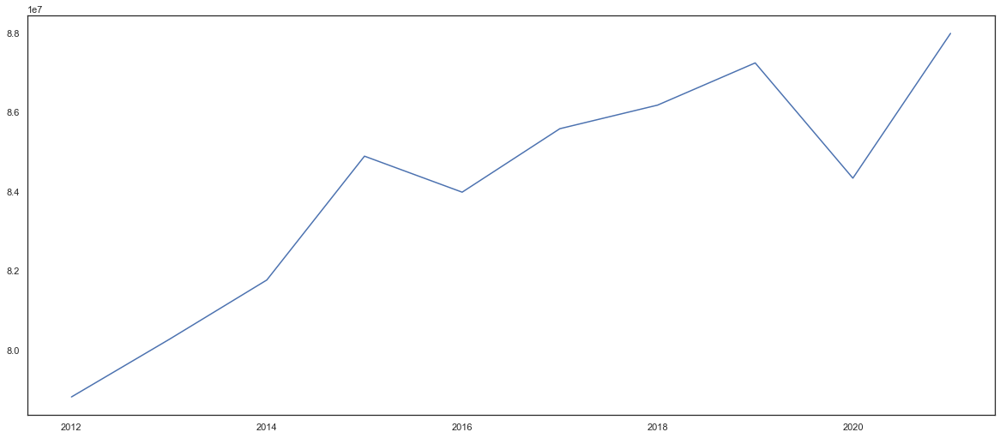

In [735]:
waterfall_uk_hourly_df.sum().plot()

In [453]:
# plotting a simple waterfall chart

fig = go.Figure(go.Waterfall(
    name = "20", orientation = "v",

    
    x = waterfall_uk_hourly_df.columns,
    y = waterfall_uk_hourly_df,
    
    measure = ["initial", "relative", "relative", "total","relative",
                   "relative", "relative","relative", "relative",  "total"],
    
    textposition = "outside",
    
#     increasing = {"marker":{"color":"red"}},
#     totals = {"marker":{"color":"blue"}},
    connector = {"visible": False},

    text = ['€'+ str(i) for i in waterfall_uk_hourly_df.sum().values],
    
    decreasing = {"marker":{"color":"Maroon", "line":{"color":"red", "width":2}}},
    increasing = {"marker":{"color":"Teal"},},
    totals = {"marker":{"color":"deep sky blue", "line":{"color":"blue", "width":3}}}
    
))


fig.add_shape(
    type="rect", fillcolor="blue", line=dict(color="blue"), opacity=1,
    x0=-0.4, x1=0.4, xref="x", y0=0.0, y1=fig.data[0].y[0], yref="y"
)

fig.add_shape(
    type="rect", fillcolor="green", line=dict(color="green"), opacity=1,
    x0=3.6, x1=4.4, xref="x",
    y0=fig.data[0].y[-1] - fig.data[0].y[-2], y1=fig.data[0].y[-1], yref="y"
)


fig.update_layout(
        title = "How the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK",
        showlegend = True,
    font=dict(
        family="Courier New, monospace",
        size=18,  # Set the font size here
        color="RebeccaPurple",
    ),
    autosize=False,
    width=1000,
    height=600,
     waterfallgap = 0.3
)

fig.update_layout(title = "Profit and loss statement",)


fig.show()

The first column initial contains the value at the start of the year 2012. Then for each quarter, we can see that the amount has increased. This shows how the sum of each year increase seasonaly.

This covid had no negative impact on the hourly pay of both full-time and part-time workers in the UK; it simply followed the same trend as previous years.

# Modelling

In [677]:
data = waterfall_uk_hourly_df.melt(#id_vars=['2012'],
        var_name="year")#.set_index('year')

data['year'] = pd.to_datetime(data['year'].apply(lambda x: x.split('_')[0]), format='%Y')
data = data.set_index('year')


In [678]:
# import matplotlib as mpl
# mpl.rcParams.update(mpl.rcParamsDefault)


# Time Series Prediction

What is time series?¶

    A time series is a collection of data points gathered at regular intervals of time.
It is time-critical.
Seasonality trends can be seen in the majority of time series. For example, if we sell ice cream, we can anticipate increased sales during the summer. As a result, seasonality trends can be seen in this time series.

Lets visualize and check seasonality trend of our time series.

In [679]:
data

,value
year,
2012-01-01,8778000.0
2012-01-01,466000.0
2012-01-01,907000.0
2012-01-01,306000.0
2012-01-01,84000.0
...,...
2021-01-01,14.24
2021-01-01,13.82
2021-01-01,13.46


In [680]:
ts = data.copy()
series = data.copy()

In [681]:
series.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9680 entries, 2012-01-01 to 2021-01-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   value   9680 non-null   object
dtypes: object(1)
memory usage: 151.2+ KB


# From
https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/

If you use only the previous values of the time series to predict its future values, it is called Univariate Time Series Forecasting.

In [682]:
series

,value
year,
2012-01-01,8778000.0
2012-01-01,466000.0
2012-01-01,907000.0
2012-01-01,306000.0
2012-01-01,84000.0
...,...
2021-01-01,14.24
2021-01-01,13.82
2021-01-01,13.46


In [683]:
plt.rc("figure", figsize=(18,8))


<AxesSubplot:ylabel='Frequency'>

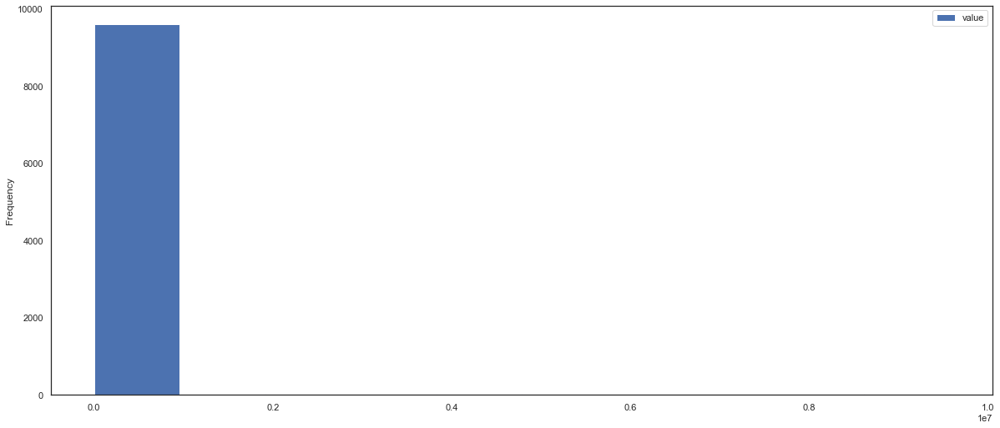

In [684]:
# plt.figr
series.plot.hist()

year
2012-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
2013-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
2014-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
2015-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
2016-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
2017-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
2018-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
2019-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
2020-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
2021-12-31    AxesSubplot(0.08,0.2;0.87x0.68)
Freq: A-DEC, Name: value, dtype: object

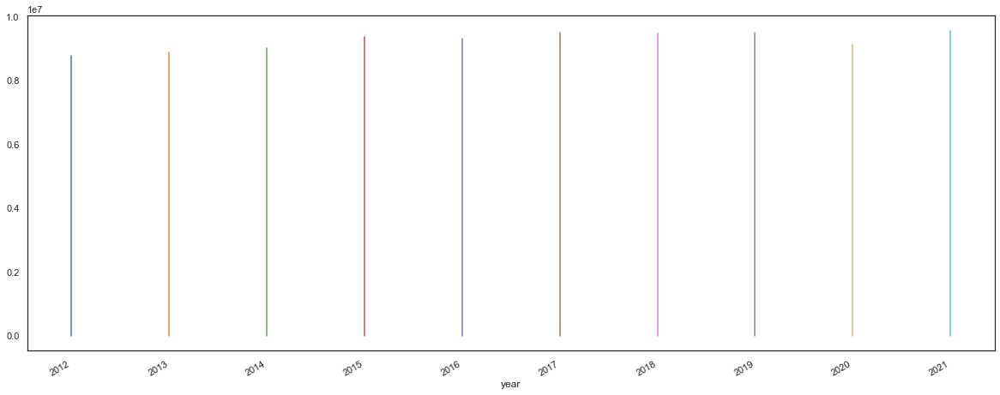

In [685]:
series.value.resample('Y').plot()

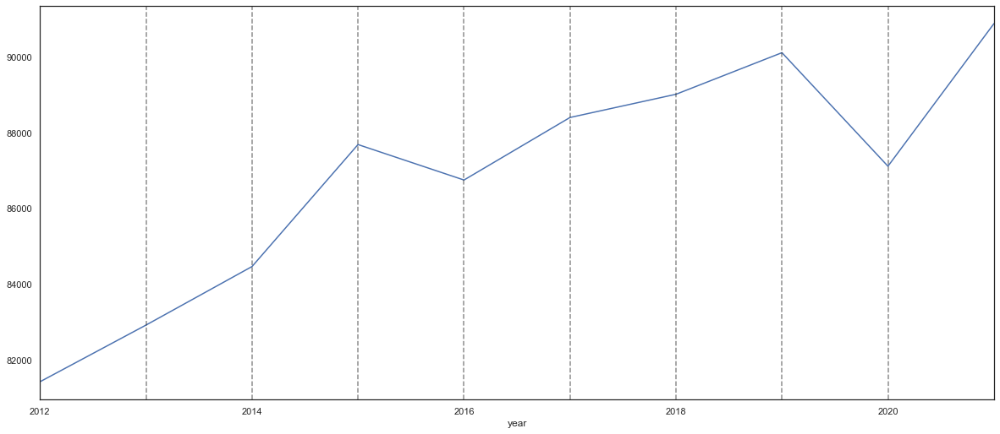

In [686]:
import datetime
# frequency conversion and resampling of time series
ts_year_avg = series.value.resample('Y').sum()
series.value.resample('Y').mean().plot()
for i in range(2012, 2021):
    plt.axvline(datetime.datetime(i, 1, 1), color='k', linestyle='--', alpha=.5)

We can see a straight transition to the next year because there was no month in the data. This even suggests that there is no variation that would allow us to forecast.

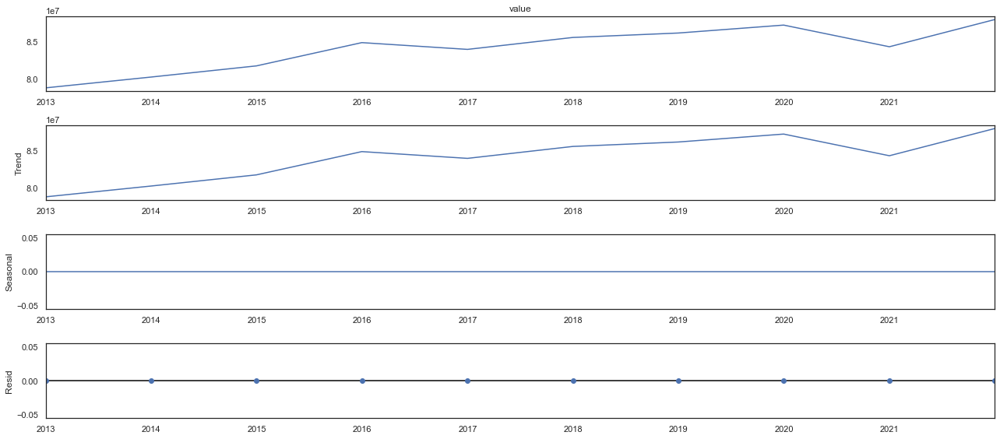

In [687]:
from statsmodels.tsa.seasonal import seasonal_decompose 

# plt.figure(figsize=(18,8))

decomposition = seasonal_decompose(ts_year_avg, model='additive') # multiplicative

decomposition.plot()

plt.show()

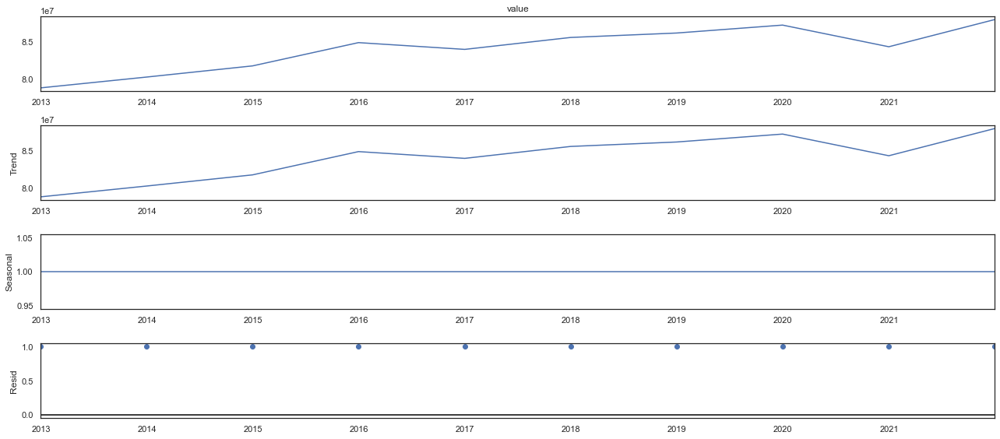

In [688]:
decomposition = seasonal_decompose(ts_year_avg, model='multiplicative')
decomposition.plot()
plt.show()

We can also see from the residual plot that it is zero. This is a good example of how the naive, or classical, decomposition failed to separate the noise from the linear trend.

---
- As we can see, there is a upward trend and an annual stable seasonality in the data. 
- Insofar as the series' mean fluctuates seasonally and is consequently time-dependent, a stable seasonal pattern is not stationary.


In [689]:
from statsmodels.tsa import seasonal

In [690]:
seasonal.seasonal_decompose

<function statsmodels.tsa.seasonal.seasonal_decompose(x, model='additive', filt=None, period=None, two_sided=True, extrapolate_trend=0)>

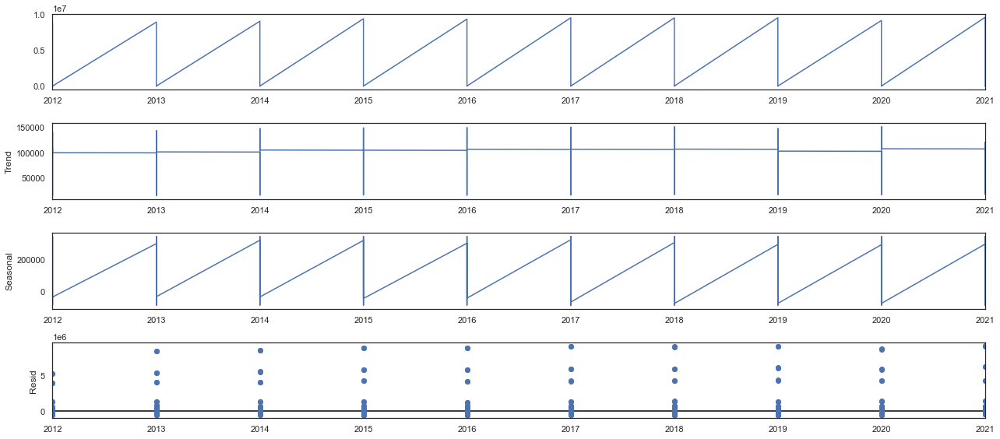

In [691]:
decomp = seasonal.seasonal_decompose(series, period=365)
decomp.plot();

#### Forecast


In [549]:
short_obs = series.head(10000)
short_obs

,value
year,
2012-01-01,8778000.0
2012-01-01,466000.0
2012-01-01,907000.0
2012-01-01,306000.0
2012-01-01,84000.0
...,...
2021-01-01,14.24
2021-01-01,13.82
2021-01-01,13.46


In [722]:
# apply the decomp to the truncated observation
short_decomp = seasonal.seasonal_decompose(short_obs, period=12)

short_decomp


In [723]:
short_decomp.observed

year
2012-01-01    8778000.00
2012-01-01     466000.00
2012-01-01     907000.00
2012-01-01     306000.00
2012-01-01      84000.00
                 ...    
2021-01-01         14.24
2021-01-01         13.82
2021-01-01         13.46
2021-01-01         13.34
2021-01-01         13.87
Length: 9680, dtype: float64

In [725]:
ds = short_decomp.observed
>>> data = np.log(ds) # take the log of the decompose
>>> base_date = f"{int(ds.index.year[0])}"#"-{3*int(ds.index.month[0])+1}-1"
>>> data.index = pd.date_range(base_date, periods=ds.shape[0])

In [726]:
data

2012-01-01    15.987759
2012-01-02    13.051941
2012-01-03    13.717898
2012-01-04    12.631340
2012-01-05    11.338572
                ...    
2038-06-28     2.656055
2038-06-29     2.626117
2038-06-30     2.599722
2038-07-01     2.590767
2038-07-02     2.629728
Freq: D, Length: 9680, dtype: float64

In [727]:
#  ARIMA, model_kwargs={"order": (2, 1, 0)})
from statsmodels.tsa.arima.model import ARIMA

STL is a versatile and robust time series decomposition method. STL stands for "Seasonal and Trend decomposition using Loess," and Loess is a nonlinear relationship estimation method.

Reference: https://otexts.com/fpp2/stl.html

In [728]:
# >>> stlf = STLForecast(data, ARIMA, model_kwargs={"order": (1,0,1)})
>>> stlf = STLForecast(data, ARIMA, model_kwargs={"order": (2, 1, 0)})
>>> res = stlf.fit()
>>> forecasts = res.forecast(12)

In [729]:
forecasts.values

array([2.66260544, 2.65972629, 2.67192294, 2.67044057, 2.58851367,
       2.64010371, 2.61708484, 2.66750489, 2.65805895, 2.67251167,
       2.67023492, 2.58858572])

In [730]:
pd.DataFrame(forecasts)

,0
2038-07-03,2.662605
2038-07-04,2.659726
2038-07-05,2.671923
2038-07-06,2.670441
2038-07-07,2.588514
2038-07-08,2.640104
2038-07-09,2.617085
2038-07-10,2.667505
2038-07-11,2.658059
2038-07-12,2.672512


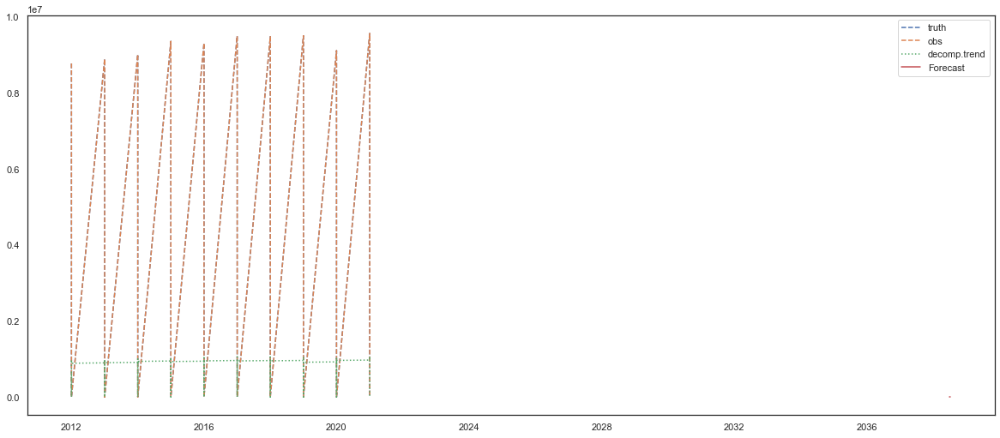

In [731]:
plt.plot(series, '--', label='truth')
plt.plot(short_obs, '--', label='obs')
plt.plot(short_decomp.trend, ':', label='decomp.trend')
plt.plot(forecasts, '-', label='Forecast')

# plt.xlim('2022','2023'); 
# plt.ylim(330,380);
plt.legend();

Text(0.5, 1.0, '2023 forecast')

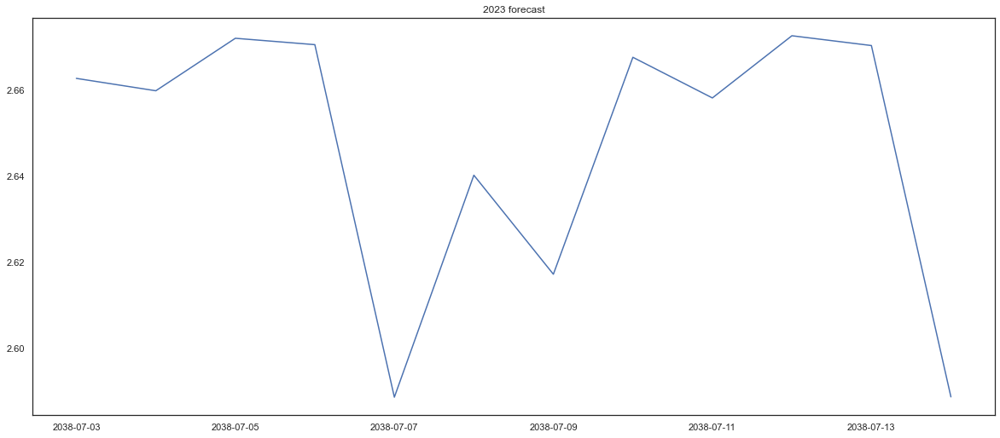

In [734]:
plt.plot(forecasts, '-', label='Forecast')
plt.title('2023 forecast')